# Analyzing and Predicting Airbnb Listing Price and Host Type in New York City
#### Team 3B (Yulong Gong, Peter Mankiewich, Ruchika Venkateswaran, Phoenix Wang, Yangyang Zhou)

---

## Project Objectives

Our primary objectives are:
* Analyzing neighborhood popularity for superhosts and non-superhosts, based on traffic, types of rooms (private rooms/shared rooms/entire apartment), and price
* Drawing a comparison between the pre- and post-COVID listing prices
* Predicting the type of host (superhosts/non-superhosts) and understanding what attributes contribute to the classification of a superhost
* Predicting the price for Airbnb listings in New York City and understanding what features contribute to profitable business opportunities for Airbnb


## Dataset Overview
Our datasets were taken from [InsideAirbnb](http://insideairbnb.com/get-the-data.html) and were last updated in October 2020.


1. [Listings](http://data.insideairbnb.com/united-states/ny/new-york-city/2020-10-05/data/listings.csv.gz) (Detailed listings data for New York City.)
2. [Reviews](http://data.insideairbnb.com/united-states/ny/new-york-city/2020-10-05/data/reviews.csv.gz) (Detailed review data for listings in New York City.)
3. [Calendar](http://data.insideairbnb.com/united-states/ny/new-york-city/2020-10-05/data/calendar.csv.gz) (Detailed calendar data for listings in New York City.)
4. [Neighborhoods](http://data.insideairbnb.com/united-states/ny/new-york-city/2020-10-05/visualisations/neighbourhoods.csv) (Lists of neighborhoods and boroughs in New York City.)



## Import Required Packages

In [1]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
! pip install missingno
import missingno as msno
import math
from os import path

# plotly imports
! pip install plotly
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px

# wordcloud imports
! pip install wordcloud
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

# folium imports
! pip install folium
import folium
from folium import Choropleth, Circle, Marker
from folium.plugins import HeatMap, MarkerCluster

# importing models for preprocessing and splitting data
from sklearn import preprocessing
from sklearn.model_selection import train_test_split

# importing packages for classification models
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
from sklearn.metrics import accuracy_score

import sklearn
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
from sklearn import metrics
from sklearn.feature_selection import RFE
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold
from sklearn.tree import DecisionTreeRegressor
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder

from IPython.display import Image

     |████████████████████████████████| 13.1 MB 8.0 MB/s eta 0:00:01
     |████████████████████████████████| 366 kB 9.1 MB/s eta 0:00:01
     |████████████████████████████████| 93 kB 2.0 MB/s eta 0:00:011


## Reading in Data

In [2]:
listings = pd.read_csv("http://data.insideairbnb.com/united-states/ny/new-york-city/2020-10-05/data/listings.csv.gz")
calendar_2020_1 = pd.read_csv("http://data.insideairbnb.com/united-states/ny/new-york-city/2020-01-03/data/calendar.csv.gz")
reviews = pd.read_csv("http://data.insideairbnb.com/united-states/ny/new-york-city/2020-10-05/data/reviews.csv.gz", parse_dates=['date'])
neighborhoods = pd.read_csv("http://data.insideairbnb.com/united-states/ny/new-york-city/2020-10-05/visualisations/neighbourhoods.csv")

# Inspecting the Datasets

## Listings DataFrame


**Here is a glimpse of the Listings dataframe.**

In [3]:
listings.head(2)

,id,listing_url,scrape_id,last_scraped,name,description,neighborhood_overview,picture_url,host_id,host_url,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,2595,https://www.airbnb.com/rooms/2595,20201005145859,2020-10-07,Skylit Midtown Castle,"Beautiful, spacious skylit studio in the heart...",Centrally located in the heart of Manhattan ju...,https://a0.muscache.com/pictures/f0813a11-40b2...,2845,https://www.airbnb.com/users/show/2845,...,10.0,10.0,9.0,NaN,f,2,2,0,0,0.36
1,3831,https://www.airbnb.com/rooms/3831,20201005145859,2020-10-09,"Whole flr w/private bdrm, bath & kitchen(pls r...","Enjoy 500 s.f. top floor in 1899 brownstone, w...",Just the right mix of urban center and local n...,https://a0.muscache.com/pictures/e49999c2-9fd5...,4869,https://www.airbnb.com/users/show/4869,...,9.0,9.0,9.0,NaN,f,1,1,0,0,4.82


**How many observations and features are in the Listings dataframe?**

There are 44666 unique observations (listings) and 74 features.

In [4]:
listings.shape

(44666, 74)

In [5]:
# Display the number of unique ids
len(listings.id.unique())

44666

**Here is an overview of the Listings dataframe.**

In [6]:
listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44666 entries, 0 to 44665
Data columns (total 74 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            44666 non-null  int64  
 1   listing_url                                   44666 non-null  object 
 2   scrape_id                                     44666 non-null  int64  
 3   last_scraped                                  44666 non-null  object 
 4   name                                          44650 non-null  object 
 5   description                                   43385 non-null  object 
 6   neighborhood_overview                         28207 non-null  object 
 7   picture_url                                   44666 non-null  object 
 8   host_id                                       44666 non-null  int64  
 9   host_url                                      44666 non-null 

## Calendar DataFrame

**Here is a glimpse of the Listings dataframe.**

In [8]:
calendar_2020_1.head(2)

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights
0,17693,2020-01-04,t,$75.00,$75.00,2.0,28.0
1,2595,2020-01-04,t,$175.00,$175.00,7.0,1125.0


**How many observations and features are in the Calendar dataframe?**

There are 18747307 observations and 7 features.



In [9]:
calendar_2020_1.shape

(18747307, 7)

**Here is an overview of the Calendar dataframe.**

In [10]:
calendar_2020_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18747307 entries, 0 to 18747306
Data columns (total 7 columns):
 #   Column          Dtype  
---  ------          -----  
 0   listing_id      int64  
 1   date            object 
 2   available       object 
 3   price           object 
 4   adjusted_price  object 
 5   minimum_nights  float64
 6   maximum_nights  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 1001.2+ MB


**Summary statistics for the numeric columns (Price will be converted from an object later in the notebook):**

In [11]:
calendar_2020_1[['minimum_nights','maximum_nights']].describe()

,minimum_nights,maximum_nights
count,1.874712e+07,1.874712e+07
mean,9.510438e+00,8.479341e+05
std,4.052425e+01,4.262858e+07
min,1.000000e+00,1.000000e+00
25%,1.000000e+00,2.900000e+01
50%,3.000000e+00,1.125000e+03
75%,5.000000e+00,1.125000e+03
max,3.456000e+03,2.147484e+09


## Reviews DataFrame

**Here is a glimpse of the Reviews dataframe.**

In [12]:
reviews.head(2)

,listing_id,id,date,reviewer_id,reviewer_name,comments
0,2595,17857,2009-11-21,50679,Jean,Notre séjour de trois nuits.\r\nNous avons app...
1,2595,19176,2009-12-05,53267,Cate,Great experience.


**How many observations and features are in the Reviews dataframe?**

There are 1003064 unique observations (comments) and 6 features.

In [13]:
reviews.shape

(1003064, 6)

In [14]:
# Display the number of unique ids
len(reviews.id.unique())

1003064

**Here is an overview of the Reviews dataframe.**

In [15]:
reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1003064 entries, 0 to 1003063
Data columns (total 6 columns):
 #   Column         Non-Null Count    Dtype         
---  ------         --------------    -----         
 0   listing_id     1003064 non-null  int64         
 1   id             1003064 non-null  int64         
 2   date           1003064 non-null  datetime64[ns]
 3   reviewer_id    1003064 non-null  int64         
 4   reviewer_name  1003056 non-null  object        
 5   comments       1002383 non-null  object        
dtypes: datetime64[ns](1), int64(3), object(2)
memory usage: 45.9+ MB


**When was the oldest comment posted and when was the latest posted?**

The oldest comment was posted on April 23, 2009 and the latest was posted on October 11, 2020

In [16]:
print(reviews.date.min())
print(reviews.date.max())

2009-04-23 00:00:00
2020-10-11 00:00:00


## Neighborhoods DataFrame

**Here is a glimpse of the Neighborhoods dataframe.**

In [17]:
neighborhoods.head(2)

,neighbourhood_group,neighbourhood
0,Bronx,Allerton
1,Bronx,Baychester


**How many observations are in the Neighborhoods dataframe?**

There are 5 boroughs and 230 unique observations (neighborhoods).

In [18]:
neighborhoods.shape

(230, 2)

In [19]:
# Desplay the number of unique boroughs
len(neighborhoods.neighbourhood_group.unique())

5

In [20]:
# Display the number of unique neighborhoods
len(neighborhoods.neighbourhood.unique())

230

**Here is an overview of the Neighborhoods dataframe.**

In [21]:
neighborhoods.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 230 entries, 0 to 229
Data columns (total 2 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   neighbourhood_group  230 non-null    object
 1   neighbourhood        230 non-null    object
dtypes: object(2)
memory usage: 3.7+ KB


**Summary statistics for the Neighborhoods dataframe.**

In [22]:
neighborhoods.describe()

,neighbourhood_group,neighbourhood
count,230,230
unique,5,230
top,Queens,East Elmhurst
freq,53,1


**How many neighborhoods are there in each borough?**

Queens has the most neighborhoods (53) and Manhattan has the least (32).

In [23]:
neighborhoods.groupby('neighbourhood_group').count()

,neighbourhood
neighbourhood_group,
Bronx,49
Brooklyn,48
Manhattan,32
Queens,53
Staten Island,48


**A preview of the neighborhoods within a borough.**

In [24]:
# Take Manhattan for example
neighborhoods[neighborhoods['neighbourhood_group'] == "Manhattan"].head()

,neighbourhood_group,neighbourhood
97,Manhattan,Battery Park City
98,Manhattan,Chelsea
99,Manhattan,Chinatown
100,Manhattan,Civic Center
101,Manhattan,East Harlem


# Cleaning the Datasets

## Listings DataFrame

After inspecting the Listings dataframe, we now proceed to analyze potential misssing values and outliers. We will also ensure that data within each of the columns is of the right datatype and format, and is ready to be used in the rest of the EDA phase.

**How many missing values are there in each column?**

There are three empty columns -- "bathrooms", "calendar_updated", and "license".

In [25]:
null_vals = listings.isnull().sum()
null_vals[null_vals > 0].sort_values(ascending=False)

bathrooms                      44666
calendar_updated               44666
license                        44666
host_response_time             23079
host_response_rate             23079
host_about                     17874
host_acceptance_rate           16865
neighborhood_overview          16459
neighbourhood                  16458
review_scores_location         11616
review_scores_value            11615
review_scores_checkin          11611
review_scores_accuracy         11596
review_scores_communication    11591
review_scores_cleanliness      11583
review_scores_rating           11564
reviews_per_month              10517
first_review                   10517
last_review                    10517
host_neighbourhood              7280
bedrooms                        4259
description                     1281
beds                             513
host_location                    142
bathrooms_text                    90
host_total_listings_count         17
host_listings_count               17
h

**Converting "price" column to the correct format and data type.**

In [26]:
# First converting price into a string to remove '$' and ',' and then converting it into a float 
listings['price'] = listings['price'].astype('string')
listings['price'] = listings['price'].str.replace('$','')
listings['price'] = listings['price'].str.replace(',','')
listings['price'] = listings['price'].astype('float')
listings['price']

0        175.0
1         76.0
2         60.0
3        175.0
4         73.0
         ...  
44661     50.0
44662    200.0
44663     92.0
44664    120.0
44665     54.0
Name: price, Length: 44666, dtype: float64

**How many listings are with a price of $0?**

There are 25 observations (listings) where the price is $0.

In [27]:
# Identifying rows with price of the listing as $0
listings[listings['price'] == 0]['price'].count()

25

**How many listings have no beds?**

There are 1595 listings with no beds, which equals to 3.57% of the total number of listings.

In [28]:
# Identifying rows with no beds
listings[listings['beds'] == 0]['beds'].count() / len(listings)

0.03570948820131644

**Which listing has the most beds?**

We learned from the summary statistics that the maximum number of beds is 40 among all listings. After inspecting this outlier, we found that this observation is reasonable and should not be dropped from the dataframe since it says it hosts 16 people.

In [29]:
# Inspecting rows with 40 beds
listings[listings['beds'] == 40]

,id,listing_url,scrape_id,last_scraped,name,description,neighborhood_overview,picture_url,host_id,host_url,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
2978,2261367,https://www.airbnb.com/rooms/2261367,20201005145859,2020-10-09,brooklyn 14 bedroom gated community,One of a kind in Brooklyn! A huge home it inc...,Sea Gate is a hidden gem. In the summer the o...,https://a0.muscache.com/pictures/5cc30306-6ac0...,10416706,https://www.airbnb.com/users/show/10416706,...,10.0,10.0,10.0,NaN,t,1,1,0,0,0.22


We will drop all observations in which the price, number of beds, or accommodates is zero since these values would not make sense in context.

In [30]:
drop_df = listings[(listings['beds'] == 0) | (listings['price'] == 0) | (listings['accommodates'] == 0)].index
listings.drop(drop_df, inplace=True)

After finding that the median number of beds and bedrooms is 1, we have filled the missing values for both these columns with 1.

In [31]:
print(listings['beds'].median())
print(listings['bedrooms'].median())

listings.beds = listings.beds.fillna(1)
listings.bedrooms = listings.bedrooms.fillna(1)

1.0
1.0


We will also remove observations with missing values in any of these columns.

In [32]:
listings.dropna(subset=['first_review', 'last_review', 'review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication', 'review_scores_location', 'review_scores_value', 'reviews_per_month'], thresh=10, inplace=True)

Lastly, we decide to drop the columns that are not significant to EDA and furthur analysis.

In [33]:
listings.drop(['scrape_id', 'minimum_nights', 'maximum_nights', 'minimum_minimum_nights',
       'maximum_minimum_nights', 'minimum_maximum_nights',
       'maximum_maximum_nights', 'minimum_nights_avg_ntm',
       'maximum_nights_avg_ntm', 'bathrooms','calendar_updated','license', 'host_total_listings_count', 'calendar_last_scraped'], axis=1, inplace=True)

After cleaning the Listings dataframe, we now have 31880 unique observations (listings) and 60 features.

In [34]:
listings.shape

(31880, 60)

### Looking into Host-Related Data

**Are there any missing values within host-related data?**

<AxesSubplot:>

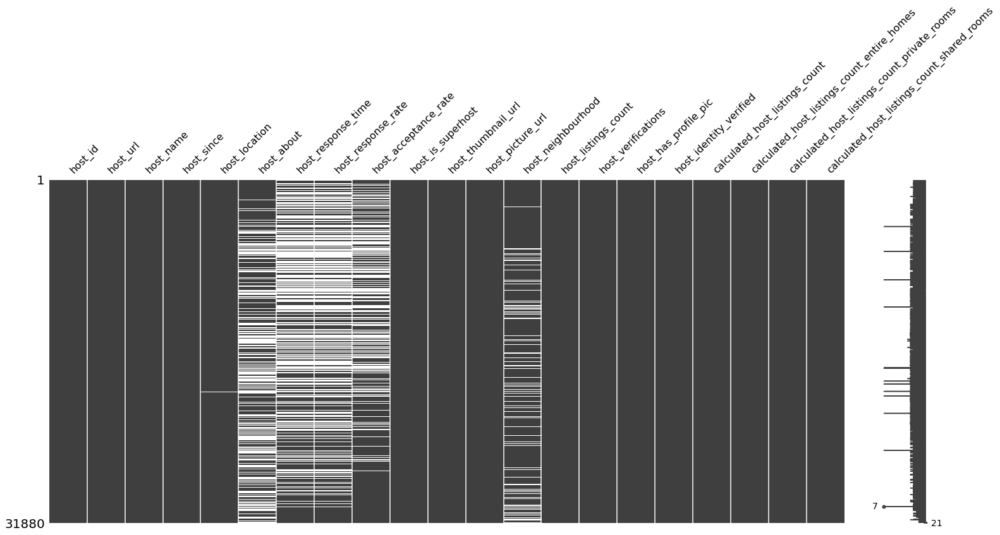

In [35]:
msno.matrix(listings[['host_id', 'host_url', 'host_name', 'host_since', 'host_location', 'host_about', 'host_response_time', 'host_response_rate', 'host_acceptance_rate', 'host_is_superhost', 'host_thumbnail_url', 'host_picture_url', 'host_neighbourhood', 'host_listings_count', 'host_verifications', 'host_has_profile_pic', 'host_identity_verified', 
       'calculated_host_listings_count',
       'calculated_host_listings_count_entire_homes',
       'calculated_host_listings_count_private_rooms',
       'calculated_host_listings_count_shared_rooms']])

**Converting columns to the correct data type.**

In [36]:
listings.calculated_host_listings_count_shared_rooms = listings.calculated_host_listings_count_shared_rooms.astype('float')
listings.calculated_host_listings_count_private_rooms = listings.calculated_host_listings_count_private_rooms.astype('float')
listings.calculated_host_listings_count_entire_homes = listings.calculated_host_listings_count_entire_homes.astype('float')
listings.calculated_host_listings_count = listings.calculated_host_listings_count.astype('float')

After adding up the count of all room types, the total does not exceed the calculated_host_listings_count.

In [37]:
check_condition = (listings['calculated_host_listings_count_private_rooms'] + listings['calculated_host_listings_count_entire_homes'] + listings['calculated_host_listings_count_shared_rooms']) > listings['calculated_host_listings_count']
listings[check_condition]

,id,listing_url,last_scraped,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,...,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month


**Examine the distribution of the host acceptance rate.**

In [38]:
listings['host_acceptance_rate'].value_counts().head()

100%    7126
0%       938
97%      872
98%      837
99%      814
Name: host_acceptance_rate, dtype: int64

**Converting columns to the correct format and data type.**

In [39]:
listings['host_acceptance_rate'] = listings['host_acceptance_rate'].astype("string")
listings['host_acceptance_rate'] = listings['host_acceptance_rate'].str.replace('%','')
listings['host_acceptance_rate'] = pd.to_numeric(listings['host_acceptance_rate'], errors='coerce')
listings['host_acceptance_rate'] = listings['host_acceptance_rate'].apply(lambda x: x/100 if isinstance(x, float) else None)

**How many null values are there?**

There are 10147 null values in host_acceptance_rate because Airbnb did not report this for sellers with less reviews and data. We're not imputing the null values at this point because we won't be using this feature for our models.

In [40]:
listings['host_acceptance_rate'].isnull().sum()

10147

**Examine the distribution of the host reponse rate.**

In [41]:
listings['host_response_rate'].value_counts().head()

100%    10307
0%        745
90%       737
80%       478
50%       386
Name: host_response_rate, dtype: int64

**Converting the columns to the correct format and data types.**

In [42]:
listings['host_response_rate'] = listings['host_response_rate'].astype("string")
listings['host_response_rate'] = listings['host_response_rate'].str.replace('%','')
listings['host_response_rate'] = pd.to_numeric(listings['host_response_rate'], errors='coerce')
listings['host_response_rate'] = listings['host_response_rate'].apply(lambda x: x/100 if isinstance(x, float) else None)
listings['host_response_time'] = listings['host_response_time'].astype('string')
listings['host_is_superhost'] = listings['host_is_superhost'].astype('string')

**Examine the distribution of host_response_time.**

In [43]:
listings['host_response_time'].value_counts()

within an hour        8592
within a few hours    3739
within a day          2662
a few days or more    1228
Name: host_response_time, dtype: Int64

**What is the average response rate for each response time category?**

Hosts who response within an hour have a 97.7% response rate on average.

In [44]:
listings.groupby('host_response_time')['host_response_rate'].mean()

host_response_time
a few days or more    0.120106
within a day          0.824230
within a few hours    0.947943
within an hour        0.977199
Name: host_response_rate, dtype: float64

**What is the relationship between response rate and response time?**

Below is a visualization of the relationship between them. We found that hosts who usually reponse within an hour have the highest response rate on average, while hosts who tend to response after a few days or more have the lowest response rate.

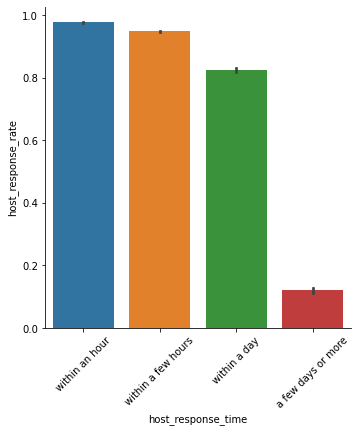

In [45]:
sns.catplot(x='host_response_time', y='host_response_rate', data=listings, kind='bar', order=['within an hour', 'within a few hours', 'within a day', 'a few days or more'])
plt.xticks(rotation =45)
plt.show();

**Is there is a relationship between acceptance rate and response rate?**

Below is a visualization of host acceptance rate and response rate and there doesn't seem to be an obvious relationship. It is possible that a popular host only respond to messages sent by the few guests he/she accepts and not responding to those he/she does not want to accept, or that a host is constantly declining requests via messages.

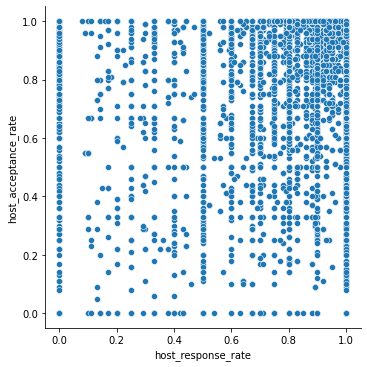

In [46]:
sns.relplot(x='host_response_rate', y='host_acceptance_rate', data=listings, kind='scatter')
plt.show();

**Encoding "host_is_superhost" and "host_identity_verified" values "T" and "F" to 1 and 0 respectively and creating separate column for binary variables.**

In [47]:
key = {'t' : 1, 'f' : 0} 
listings['is_superhost_numeric'] = listings['host_is_superhost']
listings = listings.replace({"is_superhost_numeric": key})

listings['host_identity_verified'] = listings['host_identity_verified'].astype('string')
listings['host_identity_verified_numeric'] = listings['host_identity_verified']
listings = listings.replace({"host_identity_verified_numeric": key}) 

**Converting host_since, first_review, last_review and last_scraped to datetime.**

In [48]:
listings['host_since'] = pd.to_datetime(listings['host_since'])
listings['first_review'] = pd.to_datetime(listings['first_review'])
listings['last_review'] = pd.to_datetime(listings['last_review'])
listings['last_scraped'] = pd.to_datetime(listings['last_scraped'])

We examined the listings dataframe and found that the listing_id is unique (each row represents a unique listing), but host_id is repeated when one host has multiple listings. For example, the below view shows that host_id 2787 has five listings. There are a number of columns that are repeated for each row. For example, host_acceptance_rate is 0.91 for each of the 5 rows below. In order to specifically analyze host data and avoid repeated datapoints, we will remove duplicate host id's.

In [49]:
listings[listings['host_id'] == 2787]

,id,listing_url,last_scraped,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,...,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,is_superhost_numeric,host_identity_verified_numeric
8302,7937553,https://www.airbnb.com/rooms/7937553,2020-10-08,Riomaggiore Room. Queen Bedroom in Bklyn Townh...,The Riomaggione Room features and amenities:<...,"The neighborhood is a quiet, tree lined reside...",https://a0.muscache.com/pictures/1d4a5019-6fea...,2787,https://www.airbnb.com/users/show/2787,John,...,10.0,10.0,f,7.0,1.0,4.0,2.0,0.48,1,0
10879,10160215,https://www.airbnb.com/rooms/10160215,2020-10-08,Torre del Lago Room.,The Torre de Lago Room features and amenities...,"We live on a quiet, treelined street. Restaur...",https://a0.muscache.com/pictures/109e6454-e022...,2787,https://www.airbnb.com/users/show/2787,John,...,9.0,10.0,f,7.0,1.0,4.0,2.0,0.40,1,0
10968,10267242,https://www.airbnb.com/rooms/10267242,2020-10-08,Corona free. Clean and Quiet Queen Bedroom,The Cinque Terre Room features and amenities:<...,"Quiet tree lined residential area, near conven...",https://a0.muscache.com/pictures/fea7f1aa-29a2...,2787,https://www.airbnb.com/users/show/2787,John,...,9.0,10.0,f,7.0,1.0,4.0,2.0,0.57,1,0
11192,10593675,https://www.airbnb.com/rooms/10593675,2020-10-08,"La Spezia rm. Clean, quiet and available tonight",*Clean and comfortable full sized futon bed. ...,Quiet residential neighborhood,https://a0.muscache.com/pictures/64bcce93-7184...,2787,https://www.airbnb.com/users/show/2787,John,...,10.0,9.0,f,7.0,1.0,4.0,2.0,0.40,1,0
16993,17263207,https://www.airbnb.com/rooms/17263207,2020-10-09,Corona free and clean. Liguria room.,*Clean and comfortable room with twin bed for ...,"Quiet, tree lined residential area with amenit...",https://a0.muscache.com/pictures/56e9a5f6-0acd...,2787,https://www.airbnb.com/users/show/2787,John,...,9.0,9.0,f,7.0,1.0,4.0,2.0,0.57,1,0


**Creating a new dataframe called "hosts" to store host information.**

In [50]:
column_name = ['host_id']
hosts = listings.sort_values('host_id').drop_duplicates(subset=column_name)

We can confirm there are now no duplicates because no row is returned below.


In [51]:
duplicates = hosts.duplicated(subset = column_name, keep = False)
hosts[duplicates].sort_values(by = column_name[0])

,id,listing_url,last_scraped,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,...,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,is_superhost_numeric,host_identity_verified_numeric


We now create a new calculated column so that we can determine the average price of properties per host.

In [52]:
average_price_per_host = listings.groupby('host_id')['price'].mean()
average_price_per_host_df = pd.DataFrame(average_price_per_host)
average_price_per_host_df = average_price_per_host_df.reset_index()
average_price_per_host_df = average_price_per_host_df.rename(columns={"price": "average_host_price"})
average_price_per_host_df.head()

,host_id,average_host_price
0,2571,111.0
1,2782,95.0
2,2787,104.6
3,2845,175.0
4,2868,60.0


And join this dataframe with "hosts" on host_id so that there are averages for each host in the "hosts" dataframe. We now have 25038 unique observations (hosts) in the "hosts" dataframe.

In [53]:
hosts = hosts.merge(average_price_per_host_df, on='host_id')
len(hosts.id.unique())

25038

**What is a superhost?**

A superhost is someone who provides exceptional service. On Airbnb, these hosts can be identified with a badge. A full description of a superhost can be found [here](https://www.airbnb.com/help/article/828/what-is-a-superhost). Since superhosts provide an extra level of service, we thought it would be interesting to subset the data by this feature for analysis.

**How many superhosts are there?**

There are 5363 superhosts and 19665 non-superhosts.

In [54]:
hosts['is_superhost_numeric'].value_counts()

0    19665
1     5363
Name: is_superhost_numeric, dtype: int64

About 21.42% of all the hosts are superhosts.

In [55]:
5363/25038

0.2141944244747983

**How many hosts completed identity verification?**

19608 hosts have verified their identification and 5420 hosts have not.

In [56]:
hosts['host_identity_verified_numeric'].value_counts()

1    19608
0     5420
Name: host_identity_verified_numeric, dtype: int64

**Creating two new dataframes, segmenting superhosts and non-superhosts.**

In [57]:
is_super_df = hosts[hosts.is_superhost_numeric == 1.0]
not_super_df = hosts[hosts.is_superhost_numeric == 0.0]

**Are there any listing with an unusual price?**

There are 19 listings (7.59% of all the listings) priced above $3000. We will analyze these outliers further below in our notebook and look at the links of each listing to cross-check the legitimacy of these listings.

In [58]:
hosts[hosts['price'] > 3000]['price'].count() / hosts['price'].count() * 100

0.07588465532390766

**How many of these outliers are owned by superhosts?**

2 of these listings are owned by superhosts and 17 of them are owned by non-superhosts.

In [59]:
is_super_df[is_super_df.price > 3000]['host_id'].count()

2

In [60]:
not_super_df[not_super_df.price > 3000]['host_id'].count()

17

## Calendar DataFrame

**Reading in and cleaning the calendar dataframes from March and July 2020**

In order to examine the impact of COVID-19 on Airbnb listing prices, we had read in the "calendar_2020_1" dataframe, which contains the price for each listing on each day in 2020. We also brought in two additional dataframes, "calendar_2020_3" and "calendar_2020_7", which contain the price for each listing from March to December 2020 and from July to December 2020. We can tell the impact of COVID-19 on prices by looking at the difference in the daily price between these three dataframes. This also provides us with insights into the hosts' attitude towards COVID-19.

In [61]:
calendar_2020_3 = pd.read_csv("http://data.insideairbnb.com/united-states/ny/new-york-city/2020-03-13/data/calendar.csv.gz")
calendar_2020_7 = pd.read_csv("http://data.insideairbnb.com/united-states/ny/new-york-city/2020-07-07/data/calendar.csv.gz")

In [62]:
# Convert the price and date columns to the appropriate format and data type
calendar_2020_1["price"]=calendar_2020_1["price"].str.replace("$","")
calendar_2020_1["price"]=calendar_2020_1["price"].str.replace(",","")
calendar_2020_1["price"]=calendar_2020_1["price"].astype("float")
calendar_2020_1['date'] = pd.to_datetime(calendar_2020_1['date'])

calendar_2020_3["price"]=calendar_2020_3["price"].str.replace("$","")
calendar_2020_3["price"]=calendar_2020_3["price"].str.replace(",","")
calendar_2020_3["price"]=calendar_2020_3["price"].astype("float")
calendar_2020_3['date'] = pd.to_datetime(calendar_2020_3['date'])

calendar_2020_7["price"]=calendar_2020_7["price"].str.replace("$","")
calendar_2020_7["price"]=calendar_2020_7["price"].str.replace(",","")
calendar_2020_7["price"]=calendar_2020_7["price"].astype("float")
calendar_2020_7['date'] = pd.to_datetime(calendar_2020_7['date'])

In [63]:
# Semi-join with is_super_df to get the price of superhosts' listings in January, March, and July 2020
calendar_2020_1_super = calendar_2020_1[calendar_2020_1["listing_id"].isin(is_super_df["id"])]
calendar_2020_1_ts = calendar_2020_1_super.groupby("date").agg({"price":"mean"}).reset_index()

calendar_2020_3_super = calendar_2020_3[calendar_2020_3["listing_id"].isin(is_super_df["id"])]
calendar_2020_3_ts = calendar_2020_3_super.groupby("date").agg({"price":"mean"}).reset_index()

calendar_2020_7_super = calendar_2020_7[calendar_2020_7["listing_id"].isin(is_super_df["id"])]
calendar_2020_7_ts = calendar_2020_7_super.groupby("date").agg({"price":"mean"}).reset_index()

In [64]:
# Create 3 dataframes for January, March, and July 2020
calendar_2020_1_f = calendar_2020_1_ts.set_index("date").loc[:"2020-12-31",].reset_index()
calendar_2020_3_f = calendar_2020_3_ts.set_index("date").loc[:"2020-12-31",].reset_index()
calendar_2020_7_f = calendar_2020_7_ts.set_index("date").loc[:"2020-12-31",].reset_index()

**Reading in and cleaning the calendar dataframes from January, March, and July 2019**

To further examine the effect of COVID-19, we decided to bring in archived dataframes from 2019.

In [65]:
calendar_2019 = pd.read_csv("http://data.insideairbnb.com/united-states/ny/new-york-city/2019-01-09/data/calendar.csv.gz")
calendar_2019_3 = pd.read_csv("http://data.insideairbnb.com/united-states/ny/new-york-city/2019-03-06/data/calendar.csv.gz")
calendar_2019_7 = pd.read_csv("http://data.insideairbnb.com/united-states/ny/new-york-city/2019-07-08/data/calendar.csv.gz")

In [66]:
# Convert the price and date columns to the appropriate format and data type
calendar_2019["price"]=calendar_2019["price"].str.replace("$","")
calendar_2019["price"]=calendar_2019["price"].str.replace(",","")
calendar_2019["price"]=calendar_2019["price"].astype("float")
calendar_2019['date'] = pd.to_datetime(calendar_2019['date'])

calendar_2019_3["price"]=calendar_2019_3["price"].str.replace("$","")
calendar_2019_3["price"]=calendar_2019_3["price"].str.replace(",","")
calendar_2019_3["price"]=calendar_2019_3["price"].astype("float")
calendar_2019_3['date'] = pd.to_datetime(calendar_2019_3['date'])

calendar_2019_7["price"]=calendar_2019_7["price"].str.replace("$","")
calendar_2019_7["price"]=calendar_2019_7["price"].str.replace(",","")
calendar_2019_7["price"]=calendar_2019_7["price"].astype("float")
calendar_2019_7['date'] = pd.to_datetime(calendar_2019_7['date'])

In [67]:
# Semi-join with is_super_df to get the price of superhosts' listings in 2019
calendar_2019_super = calendar_2019[calendar_2019["listing_id"].isin(is_super_df["id"])]
calendar_2019_not_super = calendar_2019[calendar_2019["listing_id"].isin(not_super_df["id"])]

In [68]:
# Keep only the data before December 31, 2019
calendar_2019 = calendar_2019.set_index("date").loc[:"2019-12-31",].reset_index()

In [69]:
# Get the price of superhosts' listings in 2019
calendar_2019_super = calendar_2019[calendar_2019["listing_id"].isin(is_super_df["id"])]
calendar_2019_not_super = calendar_2019[calendar_2019["listing_id"].isin(not_super_df["id"])]

calendar_2019_3 = calendar_2019_3[calendar_2019_3["listing_id"].isin(is_super_df["id"])]
calendar_2019_3_ts = calendar_2019_3.groupby("date").agg({"price":"mean"}).reset_index()

calendar_2019_7 = calendar_2019_7[calendar_2019_7["listing_id"].isin(is_super_df["id"])]
calendar_2019_7_ts = calendar_2019_7.groupby("date").agg({"price":"mean"}).reset_index()

In [70]:
# Calculate the mean price to see the general trend
calendar_2019_super_ts = calendar_2019_super.groupby("date").agg({"price":"mean"}).reset_index()
calendar_2019_not_super_ts =calendar_2019_not_super.groupby("date").agg({"price":"mean"}).reset_index()

calendar_2019_3_f = calendar_2019_3_ts.set_index("date").loc[:"2019-12-31",].reset_index()
calendar_2019_7_f = calendar_2019_7_ts.set_index("date").loc[:"2019-12-31",].reset_index()

## Reviews DataFrame

In [71]:
# Drop any missing comment or any comment that has less than 3 characters
reviews.dropna(subset=['comments'], inplace=True)
reviews = reviews.loc[reviews['comments'].str.len()>3]

In [72]:
# Create two columns that indicate the year and month where a comment was posted
reviews['year'] = reviews['date'].dt.year
reviews['month'] = reviews['date'].dt.month
reviews.head(1)

,listing_id,id,date,reviewer_id,reviewer_name,comments,year,month
0,2595,17857,2009-11-21,50679,Jean,Notre séjour de trois nuits.\r\nNous avons app...,2009,11


## Neighborhoods DataFrame

**Are the boroughs the same in "listings" and "neighborhoods" dataframes?**

Yes.

In [74]:
print(np.sort(listings.neighbourhood_group_cleansed.unique()))
print(np.sort(neighborhoods.neighbourhood_group.unique()))

['Bronx' 'Brooklyn' 'Manhattan' 'Queens' 'Staten Island']
['Bronx' 'Brooklyn' 'Manhattan' 'Queens' 'Staten Island']


**How many unique neighborhoods are in the "listings" dataframe?**

There are 218 neighborhoods in the "listings" dataframe while there are 230 neighborhoods in total in New York City.

In [75]:
print(len(listings['neighbourhood_cleansed'].unique()))
print(len(neighborhoods['neighbourhood'].unique()))

218
230


**Is there any neighborhood in the "listings" dataframe not in the "neighborhoods" dataframe?**

No, all the neighborhoods appeared in the listings dataframe are included in the broader neighborhoods dataframe.

In [76]:
# The neighourhood in the listings are included in the neighbourhoods form, so we don't need to join these two forms together
listings.loc[listings['neighbourhood_cleansed'].isin(neighborhoods['neighbourhood'])==False]

,id,listing_url,last_scraped,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,...,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,is_superhost_numeric,host_identity_verified_numeric


# Exploratoy Data Analysis

## Listings DataFrame

**Visualizing the distribution of features in the listings dataframe.**

The latitude is normally distributed while the others appear to be skewed.

In [77]:
# Visualizing the distribution for every "feature"
df_new = listings[[
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_thumbnail_url', 'host_picture_url',
       'host_neighbourhood', 'host_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified', 'neighbourhood',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'has_availability', 'availability_30', 'availability_60',
       'availability_90', 'availability_365', 'number_of_reviews',
       'number_of_reviews_ltm', 'number_of_reviews_l30d', 'first_review',
       'last_review', 'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value', 'instant_bookable']]

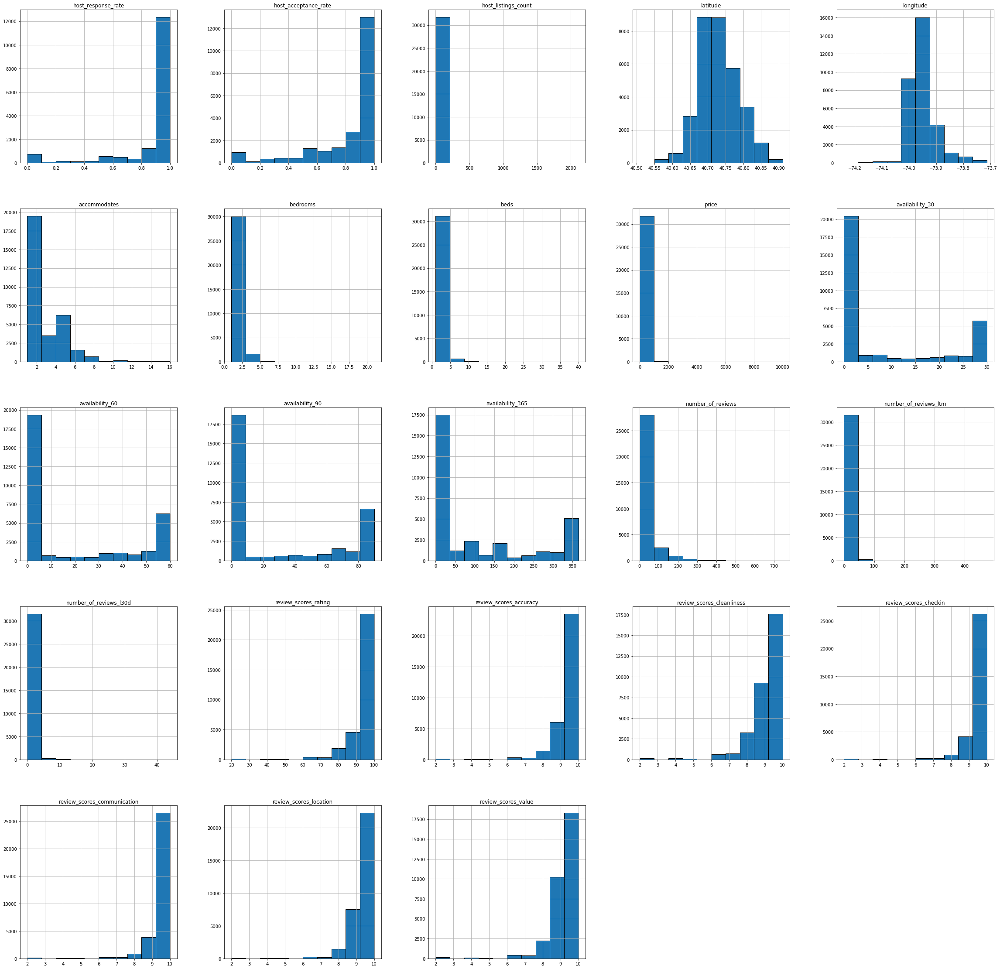

In [78]:
df_new.hist(edgecolor="black", linewidth=1, figsize=(40, 40));

In [79]:
# Create two dataframes that break down the listing data by superhost
superhost_listings = listings[listings.host_is_superhost == 't']
not_superhost_listings = listings[listings.host_is_superhost == 'f']

**What is the distribution of prices for superhosts and non-superhosts?**

On average, prices are lower for superhosts. However, we can see that there are a number of outliers, including some listings that are asking $10,000. We investigated a few of these listings to see if they look legitimate.

For example, we found [this listing](https://www.airbnb.com/rooms/13925864?source_impression_id=p3_1605909390_2yUmtCxB2UFi2CK2) which has no pictures of the actual room (2 bedrooms for $10,000/night in Queens). We decided to filter out more expensive listings in order to produce more insightful visualizations.

We can see that there are only 15 listings that are over $1000, which is only 0.3% of the dataset.

For these reasons, we are from this point forward looking at listings that are less than $1000 so that the visualizations are not highly skewed.

In [80]:
len(listings[listings.price > 1000]) / len(listings)

0.003858218318695107

In [81]:
# Examine listings with very high prices
listings[listings.id == 13925864]

,id,listing_url,last_scraped,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,...,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,is_superhost_numeric,host_identity_verified_numeric
14181,13925864,https://www.airbnb.com/rooms/13925864,2020-10-12,Puerto Plata,Puerto Plata<br /><br /><b>The space</b><br />...,Muy hermosa,https://a0.muscache.com/pictures/miso/Hosting-...,58480311,https://www.airbnb.com/users/show/58480311,Raquel-Ast,...,9.0,9.0,f,1.0,1.0,0.0,0.0,0.55,0,1


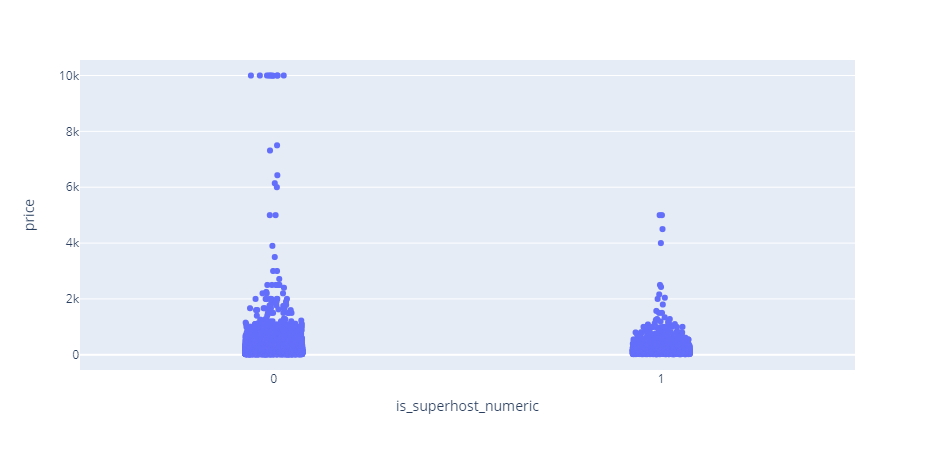

In [82]:
# Analyze the distribution of average listing price by superhost
no_na_listings = listings.dropna(subset= ['is_superhost_numeric'])
fig2 = px.strip(no_na_listings, y='price', x='is_superhost_numeric')
fig2.show()

**What is the distribution of listing prices by borough and host type?**

We can see that on average, there are more higher price listings in Manhattan compared to Queens and the Bronx which have larger distributions at lower prices.

Also, superhosts tend to have lower prices on average and much less outliers. For superhosts, the average price is the highest for Manhattan.

Text(0.5, 0, 'NYC Borough')

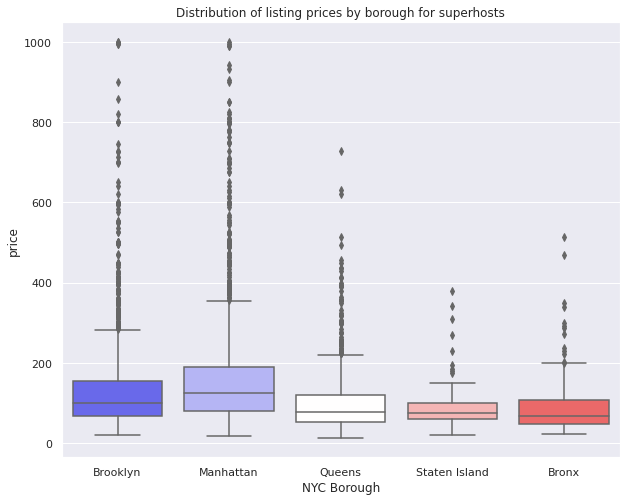

In [83]:
sns.set(rc={'figure.figsize':(10,8)})
sub2=superhost_listings[superhost_listings.price < 1000]
vis1=sns.boxplot(x='neighbourhood_group_cleansed', y='price',data=sub2,palette='bwr')
vis1.set_title('Distribution of listing prices by borough for superhosts')
vis1.set_xlabel('NYC Borough')

Text(0.5, 0, 'NYC Borough')

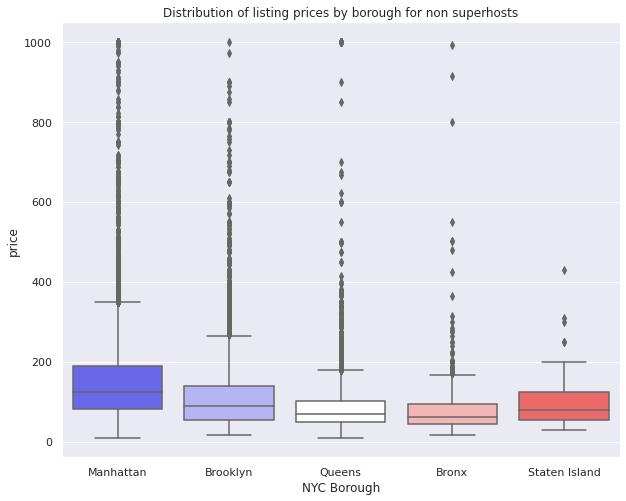

In [84]:
sns.set(rc={'figure.figsize':(10,8)})
sub2=not_superhost_listings[not_superhost_listings.price < 1000]
vis1=sns.boxplot(x='neighbourhood_group_cleansed', y='price',data=sub2,palette='bwr')
vis1.set_title('Distribution of listing prices by borough for non superhosts')
vis1.set_xlabel('NYC Borough')

**What is the distribution of room tpyes in the dataset?**

The most prolific room type is an entire home/apartment, and the least prolific appears to be the hotel room.

We observe a similar trend for both graphs above where both superhosts and non-superhosts have more number of listings that are entire homes and private rooms, as compared to shared rooms and hotel rooms (close to 0 for both superhosts and non-superhosts). A critical observation is that non-superhosts have 68% more listings that are entire homes/apartments than superhosts, and 75% more listings that are private rooms.

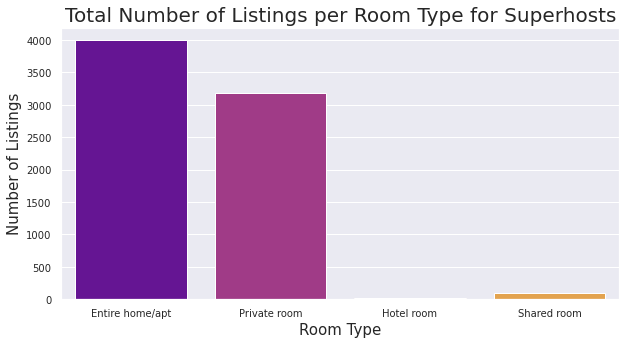

In [85]:
superhost_df = listings[listings.host_is_superhost == 't']
sns.countplot(data = superhost_df, x = 'room_type', palette="plasma")
fig = plt.gcf()
fig.set_size_inches(10, 5)

plt.title('Total Number of Listings per Room Type for Superhosts',fontsize = 20)
plt.xlabel('Room Type',fontsize = 15)
plt.ylabel('Number of Listings',fontsize = 15)
plt.tick_params(labelsize=10)
plt.show();

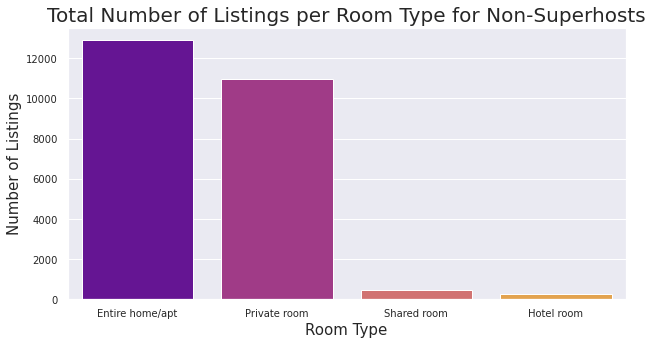

In [86]:
not_superhost_df = listings[listings.host_is_superhost == 'f']
sns.countplot(data = not_superhost_df, x = 'room_type', palette="plasma")
fig = plt.gcf()
fig.set_size_inches(10,5)

plt.title('Total Number of Listings per Room Type for Non-Superhosts',fontsize = 20)
plt.xlabel('Room Type',fontsize = 15)
plt.ylabel('Number of Listings',fontsize = 15)
plt.tick_params(labelsize=10)
plt.show()

**How many listings are there in each borough by room type?**

Hosts either offer their entire home or apartment, private room within their apartment, or a shared space in their room to potential Airbnb guests.
In New York, majority of the hosts offer their entire apartment/home to guests, followed by a private room within their apartment for rent.
In Manhattan & Brooklyn, maximum number of listings offered are that of an entire/home or apartment.
Based on the above observation, we can deduce the nature of the Airbnb hosts by neighbourhood group. Hosts in Manhattan would be looking at the Airbnb listing more as a business opportunity, as they are renting out their entire apartment, viz-a-viz hosts in Queens, Staten Island and Bronx where they would be listing out private rooms as they would be looking to earn extra money/save rent on their own apartment.

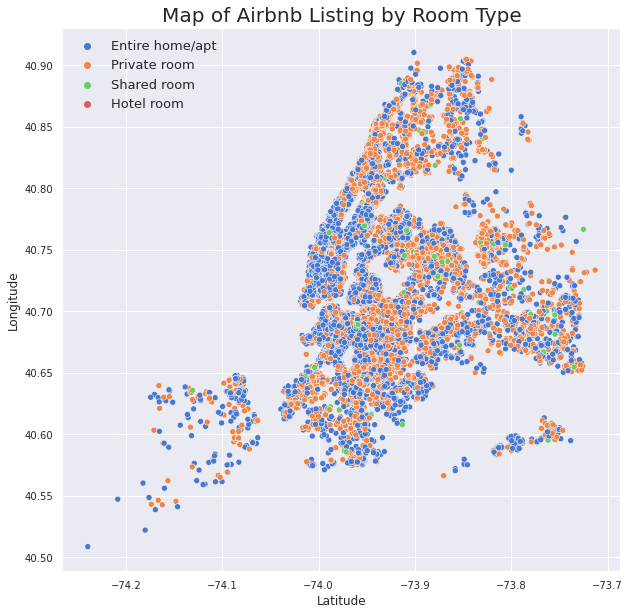

In [87]:
plt.figure(figsize=(10,10))
a = sns.scatterplot(data=listings, x='longitude', y='latitude', hue='room_type', palette='muted')
plt.title('Map of Airbnb Listing by Room Type', fontsize=20)
plt.xlabel('Latitude',fontsize=12)
plt.ylabel("Longitude",fontsize=12)
plt.legend(frameon=False, fontsize=13)
plt.tick_params(labelsize=10)

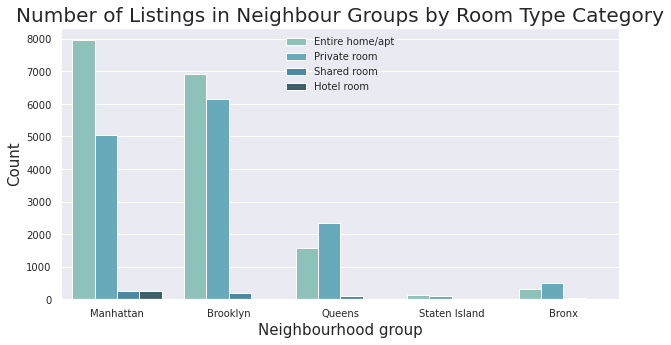

In [88]:
plt.figure(figsize=(10,5))
sns.countplot(data=listings, x='neighbourhood_group_cleansed', hue='room_type', palette='GnBu_d')
plt.title('Number of Listings in Neighbour Groups by Room Type Category', fontsize=20)
plt.xlabel('Neighbourhood group',fontsize=15)
plt.ylabel("Count",fontsize=15)
plt.legend(frameon=False, fontsize=10)
plt.tick_params(labelsize=10)

**A density heatmap of listings in New York City.**

In [89]:
m=folium.Map([40.7128,-74.0060],zoom_start=11)
HeatMap(listings[['latitude','longitude']].dropna().values,radius=8,gradient={0.2:'blue',0.4:'purple',0.6:'orange',1.0:'red'}).add_to(m)
m

**Which neighbourhoods have the largest number of listings?**

"Shared room" and "hotel room" type Airbnb listings are barely available among 10 most listing-populated neighborhoods.
For these 10 neighborhoods only Manhattan and Brooklyn boroughs are represented. Bedford-Stuyvesant and Williamsburg are the most popular for Manhattan borough and Harlem for Brooklyn.

In [90]:
# Find out the top 10 neighbourhoods that have the most listings in NYC boroughs
hot_neighborhoods = listings.neighbourhood_cleansed.value_counts().head(10)
hot_neighborhoods

Bedford-Stuyvesant    2499
Williamsburg          2417
Harlem                1834
Bushwick              1497
Upper West Side       1238
Hell's Kitchen        1186
East Village          1144
Upper East Side       1105
Crown Heights         1054
Midtown                944
Name: neighbourhood_cleansed, dtype: int64

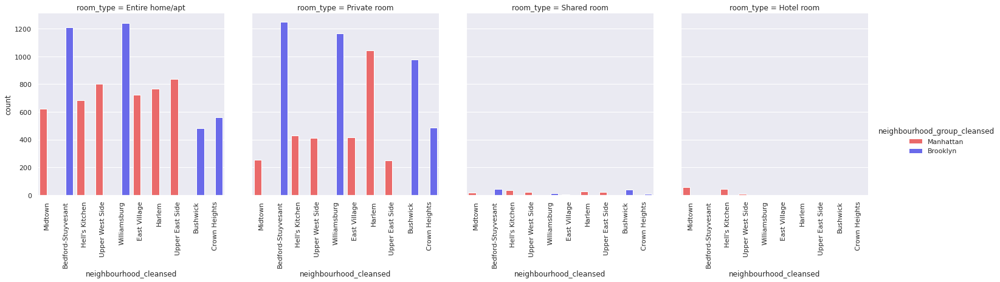

In [91]:
sub1 = listings.loc[listings['neighbourhood_cleansed'].isin(['Williamsburg','Bedford-Stuyvesant','Harlem','Bushwick','Hell\'s Kitchen',
                 'Upper West Side','Upper East Side','East Village','Crown Heights','Midtown'])]
vis1 = sns.catplot(x='neighbourhood_cleansed', hue='neighbourhood_group_cleansed', col='room_type', data=sub1, kind='count',palette='seismic_r')
vis1.set_xticklabels(rotation=90)

The word clouds below display the most prolific words contained in listing descriptions in Manhattan and Brooklyn respectivly.

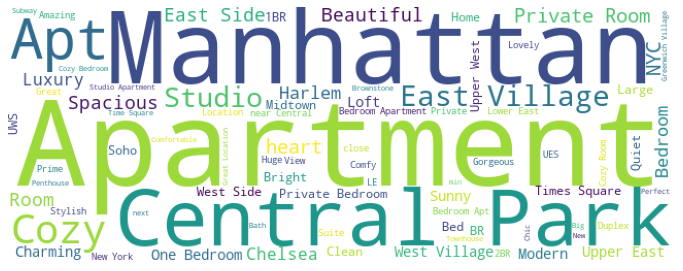

In [92]:
name_manhattan = " ".join(str(w) for w in listings.name[listings.neighbourhood_group_cleansed == "Manhattan"])
plt.subplots(figsize=(12,6))
wordcloud = WordCloud(background_color='white',width=650,height=250,max_words=80).generate(name_manhattan)
plt.imshow(wordcloud)
plt.axis('off')
plt.savefig('name.png')
plt.show()

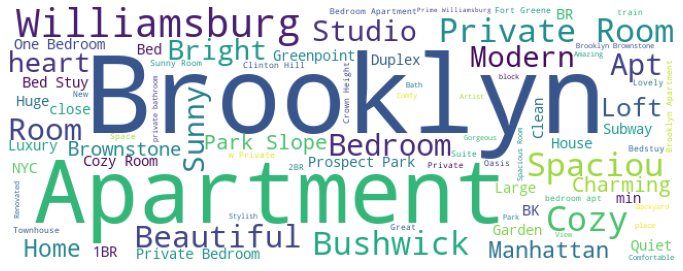

In [93]:
name_brooklyn = " ".join(str(w) for w in listings.name[listings.neighbourhood_group_cleansed == "Brooklyn"])
plt.subplots(figsize=(12,6))
wordcloud = WordCloud(background_color='white',width=650,height=250,max_words=80).generate(name_brooklyn)
plt.imshow(wordcloud)
plt.axis('off')
plt.savefig('name.png')
plt.show()

The map below shows where the listings with more than 200 reviews are located.

In [95]:
number_of_reviews = listings[(listings.number_of_reviews >= 200)]
m_3 = folium.Map(location=[40.7128,-74.0060], tiles='cartodbpositron', zoom_start=11)
# Add points to the map
mc = MarkerCluster()
for idx, row in number_of_reviews.iterrows():
    if not math.isnan(row['longitude']) and not math.isnan(row['latitude']):
        mc.add_child(Marker([row['latitude'], row['longitude']]))
m_3.add_child(mc)
# Display the map
m_3

**What is the general availability of listings by superhost?**

The general trend observed across listings available across a span of 30, 60, 90 and 365 days is that more number of non-superhosts have their listings available for 30, 60, 90 and 360 days as compared to that of superhosts. We can also observe that superhosts generally don't keep their listings available for too long in the market.

In [96]:
# Remove values in availability columns equal to 0 so that they don't get displayed in visualizations
hosts_availability = hosts[(hosts['availability_30'] != 0) & (hosts['availability_60'] != 0) & (hosts['availability_90'] != 0) & (hosts['availability_365'] != 0)]

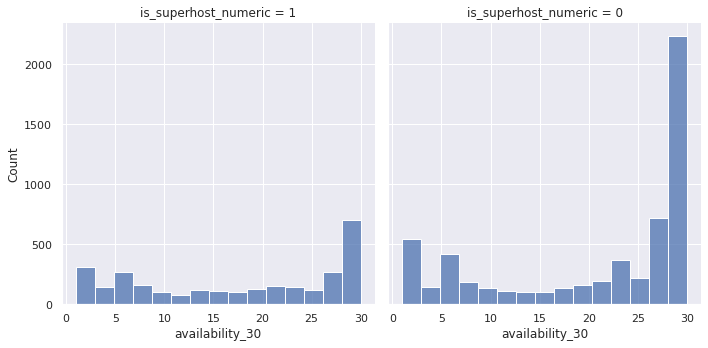

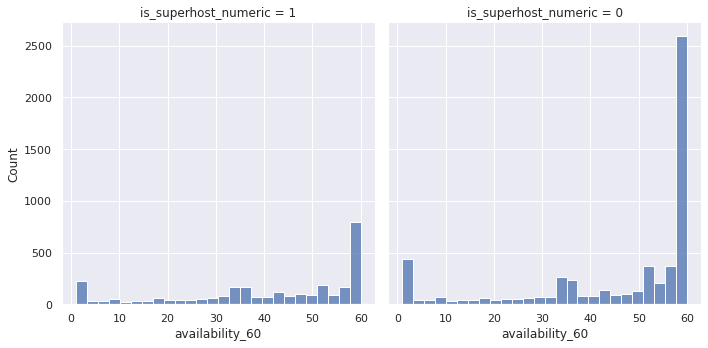

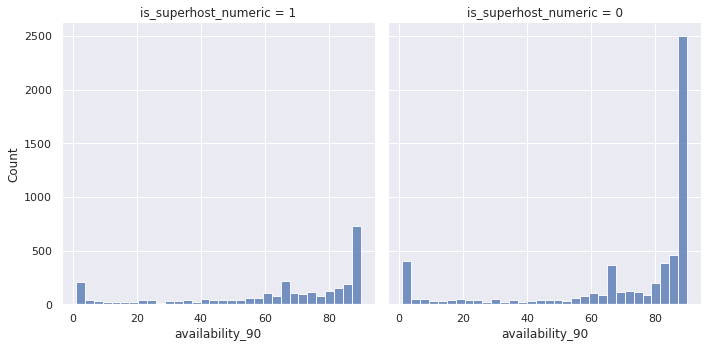

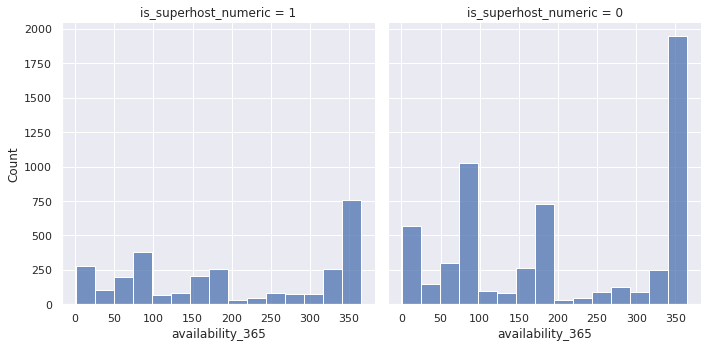

In [97]:
sns.displot(hosts_availability, x="availability_30", col="is_superhost_numeric", multiple="dodge")
sns.displot(hosts_availability, x="availability_60", col="is_superhost_numeric", multiple="dodge")
sns.displot(hosts_availability, x="availability_90", col="is_superhost_numeric", multiple="dodge")
sns.displot(hosts_availability, x="availability_365", col="is_superhost_numeric", multiple="dodge")

## Host Analysis

**How did the number of hosts on Airbnb change from 2009 to 2020?**

One of the features in the data is a date indicating when a host joined Airbnb. Below we create a new dataframe that calculates the cumualative number of hosts on Airbnb. These values are graphed on the line chart below to show how the number of hosts changes over time. We can see that starting in the early days of Airbnb, there was a slow increase in the number of hosts. By 2011 to 2012, this number started to increase greatly, and we can see some leveling off in 2020.

Every observation in our dataset has a recent date indicating when it was last scraped from the site. This means that all of the data in the graph below is from listings that were recently found to be active on Airbnb.

In [98]:
# Create a dataframe with a column for the cumulative number of hosts over time
num_host_by_date = hosts.groupby('host_since')[['host_id']].count().reset_index().rename(columns={'host_id': 'host_since_count'})
num_host_by_date['host_count_cum'] = num_host_by_date['host_since_count'].cumsum()
num_host_by_date.head()

,host_since,host_since_count,host_count_cum
0,2008-08-27,1,1
1,2008-09-07,2,3
2,2008-09-09,1,4
3,2008-09-10,2,6
4,2008-10-14,1,7


In [99]:
# Create a dataframe with the number of hosts for each year
resample_by_year = num_host_by_date.set_index('host_since').resample('Y').sum()
resample_by_year['year_cum'] = resample_by_year['host_since_count'].cumsum()
resample_by_year = resample_by_year[['year_cum']].reset_index()

resample_by_year.head()

,host_since,year_cum
0,2008-12-31,10
1,2009-12-31,174
2,2010-12-31,711
3,2011-12-31,2165
4,2012-12-31,4721


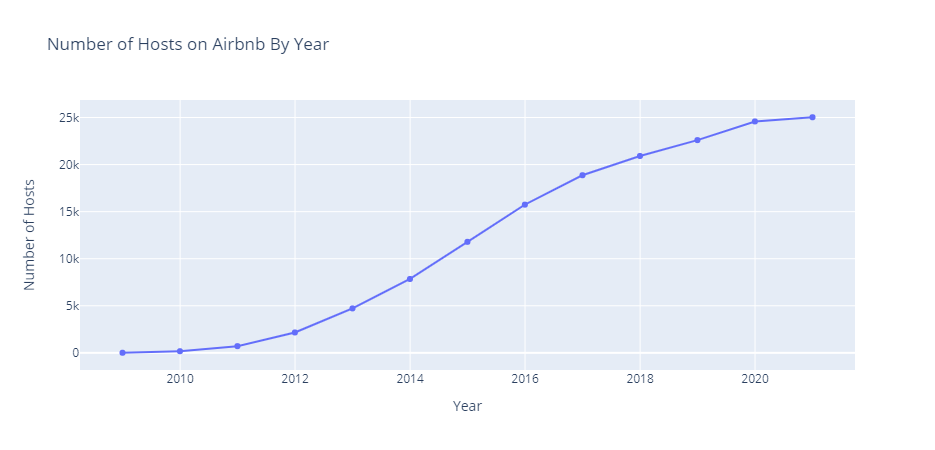

In [100]:
# Display the number of total hosts over time
fig = go.Figure(data=go.Scatter(x=resample_by_year['host_since'], y=resample_by_year['year_cum']))

fig.update_layout(title='Number of Hosts on Airbnb By Year',
                   xaxis_title='Year',
                   yaxis_title='Number of Hosts')

fig.show()

In [101]:
# Create a dataframe with the cumulative number of superhosts by date
num_super_host_by_date = is_super_df.groupby('host_since')[['host_id']].count().reset_index().rename(columns={'host_id': 'host_since_count'})
num_super_host_by_date['host_count_cum'] = num_super_host_by_date['host_since_count'].cumsum()

# Resample by year
super_host_resample_by_year = num_super_host_by_date.set_index('host_since').resample('Y').sum()
super_host_resample_by_year['year_cum'] = super_host_resample_by_year['host_since_count'].cumsum()
super_host_resample_by_year = super_host_resample_by_year[['year_cum']].reset_index()

super_host_resample_by_year.head()

,host_since,year_cum
0,2008-12-31,5
1,2009-12-31,46
2,2010-12-31,181
3,2011-12-31,515
4,2012-12-31,1020


In [102]:
# Create a dataframe with the cumulative number of non-superhosts by date
not_super_host_by_date = not_super_df.groupby('host_since')[['host_id']].count().reset_index().rename(columns={'host_id': 'host_since_count'})
not_super_host_by_date['host_count_cum'] = not_super_host_by_date['host_since_count'].cumsum()

# Resample by year
not_super_host_resample_by_year = not_super_host_by_date.set_index('host_since').resample('Y').sum()
not_super_host_resample_by_year['year_cum'] = not_super_host_resample_by_year['host_since_count'].cumsum()
not_super_host_resample_by_year = not_super_host_resample_by_year[['year_cum']].reset_index()

not_super_host_resample_by_year.head()

,host_since,year_cum
0,2008-12-31,5
1,2009-12-31,128
2,2010-12-31,530
3,2011-12-31,1650
4,2012-12-31,3701


In order to create the bar graph below, we created dataframes with the number of hosts on the site resampled by the year. The bar graph is a breakdown of the total number of hosts, the number of regular hosts, and the number of superhosts for every year. Again, we can see a pretty steady increase across all of the years, and then a slow leveling off towards the end of the range.

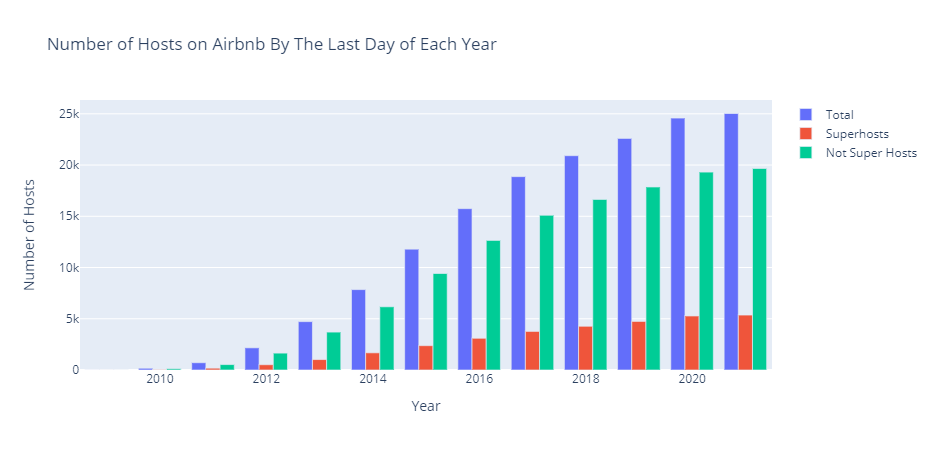

In [103]:
# Create a combined bar graph of the number of superhosts and non-superhosts by year
dates = super_host_resample_by_year['host_since']

fig = go.Figure(data=[
    go.Bar(name='Total', x=dates, y=resample_by_year['year_cum']),
    go.Bar(name='Superhosts', x=dates, y=super_host_resample_by_year['year_cum']),
    go.Bar(name='Not Super Hosts', x=dates, y=not_super_host_resample_by_year['year_cum'])
])

# Change the bar mode
fig.update_layout(barmode='group')

fig.update_layout(title='Number of Hosts on Airbnb By The Last Day of Each Year',
                   xaxis_title='Year',
                   yaxis_title='Number of Hosts')

fig.show()

**What is the proportion of hosts who are verified vs not verified?**

We can see that the majority of Airbnb hosts are verified. Identity verification, which is [explained here](https://www.airbnb.com/press/news/airbnb-announces-verified-identification), invovles a host uploading an image of their ID to ensure that they are who they say they are. We can see that the majority of Airbnb hosts have this additional safety feature.

In [104]:
# Find the count of hosts that have their identity verified
identity_verified = hosts['host_identity_verified_numeric'].value_counts()
identity_verified_df = pd.DataFrame(identity_verified).reset_index().rename(columns={'index':'verified','host_identity_verified_numeric':'host_count'})
labels = ['Verified', 'Not Verified']

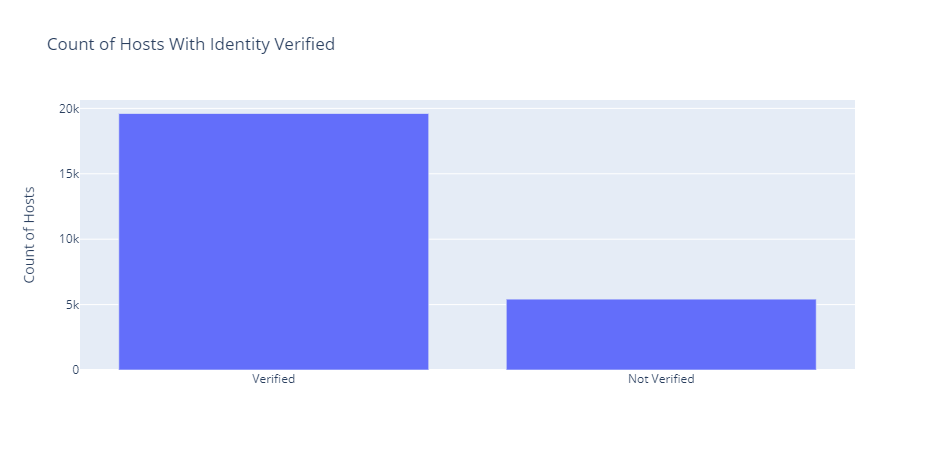

In [105]:
fig = go.Figure([go.Bar(x=labels, y=identity_verified_df['host_count'])])
fig.update_layout(title='Count of Hosts With Identity Verified', yaxis_title='Count of Hosts')
fig.show()

**What are the top 5 hosts and their locations?**

The below visualization shows the locations of Airbnb listings belonging to the top 5 hosts based on the number of listings that they have on the site. The top host, Stay With Vibe, has 103 listings all over Manhattan. These listings primarily cost less than $200 per night.

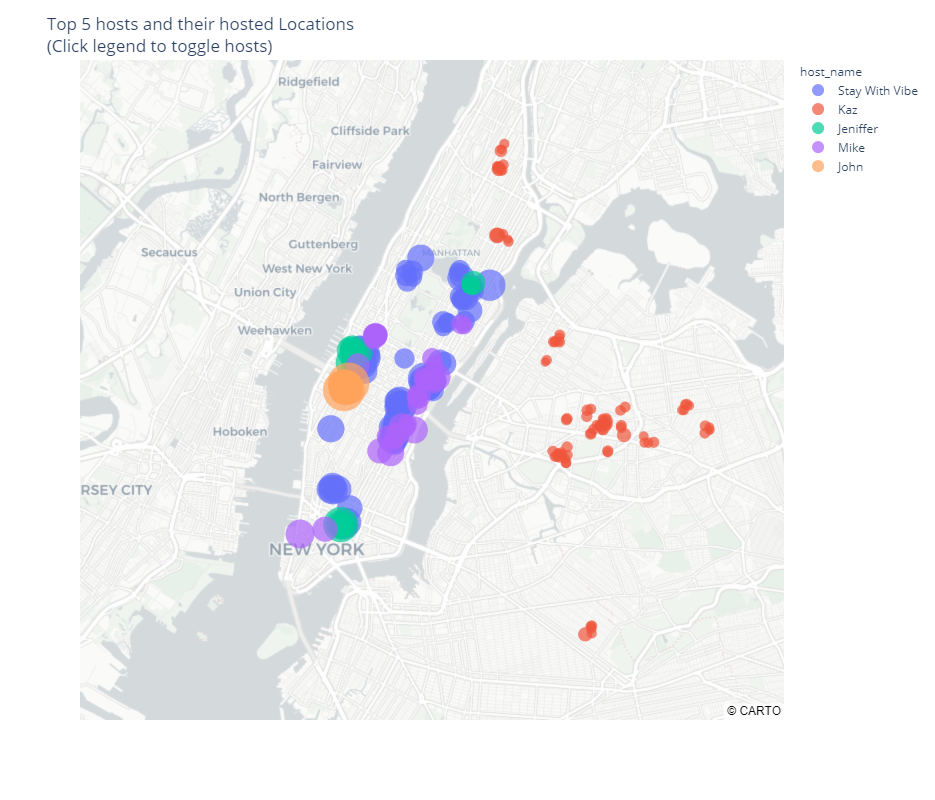

In [106]:
sub5 = listings.host_id.value_counts().reset_index().head(5)
sub5.columns = ['host_id', 'count']
sub5 = sub5.merge(listings[['host_id','host_name','price', 'latitude','longitude']], left_on = 'host_id',right_on = 'host_id', how = 'left', copy = False)
fig = px.scatter_mapbox(sub5,lat="latitude",lon="longitude",color="host_name",size="price",size_max=30,opacity = .70,zoom=11)
fig.layout.mapbox.style = 'carto-positron'
fig.update_layout(title_text = 'Top 5 hosts and their hosted Locations<br>(Click legend to toggle hosts)', height = 800)
fig.show()

## Reviews Analysis

**How many reviews were there in each year?**

The number of comments posted increased over time and 2019 has the most comments posted. After COVID outbreak, the number of comments posted dropped. This is most likely the result of travel restrictions and the decrease in demand for rooms.

In [107]:
reviews.groupby('year')['comments'].count()

year
2009       108
2010       810
2011      3392
2012      7271
2013     14254
2014     28676
2015     57739
2016    101610
2017    149566
2018    222928
2019    313366
2020    100438
Name: comments, dtype: int64

Here is a visualization of this trend. We can see a drastic change in number between 2019 and 2020.

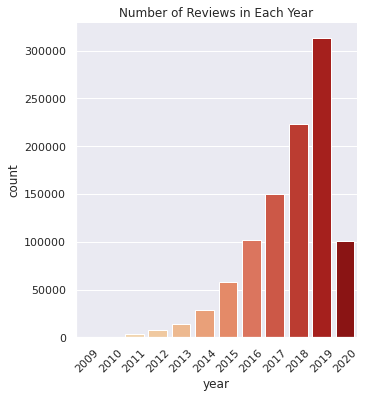

In [108]:
sns.catplot(x='year', data=reviews, kind='count', palette='OrRd')
plt.xticks(rotation=45)
plt.title("Number of Reviews in Each Year")
plt.show();

**How many comments were posted each month in 2019 and 2020?**

Below is a visualization of the distribution of the number of comments posted in 2019 and 2020. We can see that September, October and December usually have the most comments posted.

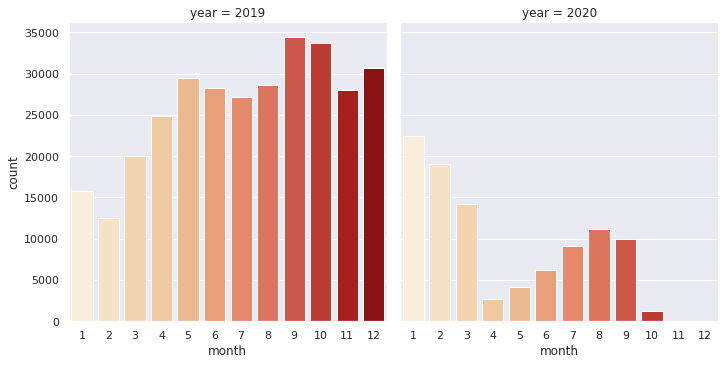

In [109]:
reviews_19_20 = reviews[(reviews['year']==2019) | (reviews['year']==2020)]
sns.catplot(x='month', data=reviews_19_20, kind='count', col='year', palette='OrRd')
plt.show();

**Who posted the most comments?**

Below are the five users that posted the most comments throughout the years. The top reviewer Elizabeth has posted 96 comments so far.

In [110]:
comments_count = reviews.groupby(['reviewer_id', 'reviewer_name'], as_index=True).agg({'comments':'count'}).sort_values(by='comments', ascending=False)
comments_count.head()

,,comments
reviewer_id,reviewer_name,
111293458,Elizabeth,96
71164558,Linda,79
563572,Daniel,66
63643121,Seth,66
115868650,Ken,61


**A glimpse into what the top reviewers said.**

It appears that Elizabeth usually leaves positive comments.

<Figure size 720x576 with 0 Axes>

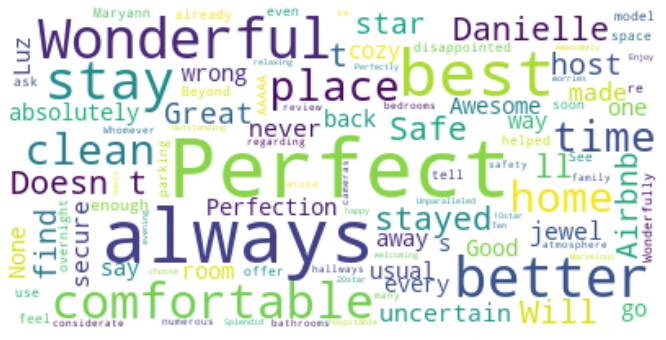

In [111]:
comments = reviews[reviews['reviewer_id']==111293458]['comments'].reset_index()

text = ""
for i in range(len(comments)):
    text = text + " " + str(comments['comments'][i])

stopwords = set(STOPWORDS)
wordcloud = WordCloud(max_font_size=50, max_words=100, stopwords=stopwords, background_color="white").generate(text)
plt.figure()
plt.figure(figsize=(12, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show();

**Which listing received the most reviews?**

Below are the five listings that received the most comments throughout the years. Listing ID 32678719 has received 743 comments in total.


In [112]:
reviews.groupby('listing_id').agg({'comments': 'count'}).sort_values(by='comments', ascending=False).head()

,comments
listing_id,
32678719,735
9145202,694
10101135,642
16276632,625
15262831,571


**A glimpse into the comments that the top listing received.**

It appears that this listing (presumably near Times Square) received more comments on its "great location", cleaniness, and other compliments.

<Figure size 720x576 with 0 Axes>

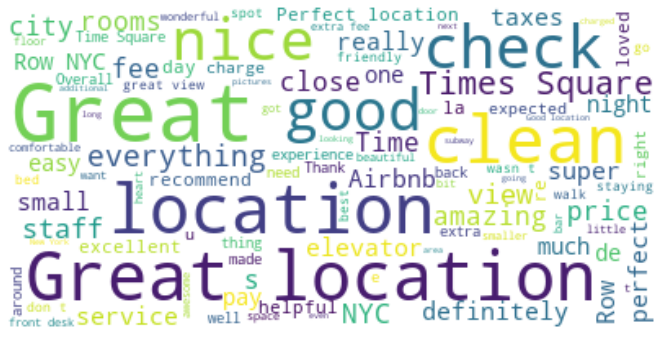

In [113]:
listing_review = reviews[reviews['listing_id']==32678719]['comments'].reset_index()

text = ""
for i in range(len(listing_review)):
    text = text + " " + str(listing_review['comments'][i])

stopwords = set(STOPWORDS)
stopwords.add('room')
stopwords.add('hotel')
stopwords.add('place')
stopwords.add('will')
stopwords.add('stay')
wordcloud = WordCloud(max_font_size=50, max_words=100, stopwords=stopwords, background_color="white").generate(text)
plt.figure()
plt.figure(figsize=(12, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show();

**How many listings received the lowest rating?**

The lowest average rating a listing received is 20 and there are 137 listings who received it.

In [114]:
lowest = listings.review_scores_rating.min()
worst_id = listings[listings.review_scores_rating==lowest]['id']
print(lowest)
print(len(worst_id))

20.0
137


**A glimpse into the comments on these listings.**

It appears that most comments these listings received were complaints against the hosts, reservations being cancelled, and the bathrooms.

<Figure size 720x576 with 0 Axes>

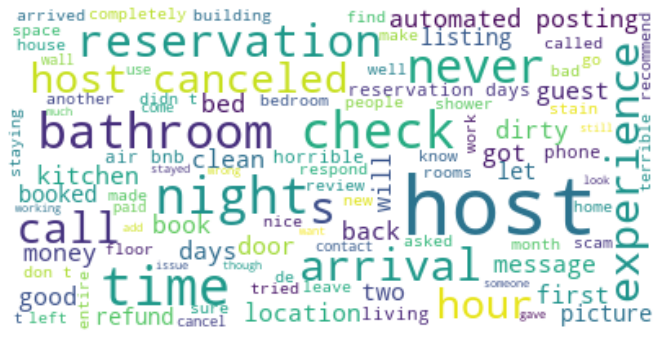

In [115]:
worst_review = reviews[reviews['listing_id'].isin(worst_id)]['comments'].reset_index()

text = ""
for i in range(len(worst_review)):
    text = text + " " + str(worst_review['comments'][i])

stopwords = set(STOPWORDS)
stopwords.add('Airbnb')
stopwords.add('place')
stopwords.add('said')
stopwords.add('really')
stopwords.add('us')
stopwords.add('even')
stopwords.add('told')
stopwords.add('one')
stopwords.add('apartment')
stopwords.add('hotel')
stopwords.add('room')
stopwords.add('day')
stopwords.add('stay')
wordcloud = WordCloud(max_font_size=50, max_words=100, stopwords=stopwords, background_color="white").generate(text)
plt.figure()
plt.figure(figsize=(12, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show();

## Pre- and Post-COVID Price Analysis

**How the average room price change in 2018 and 2019?**

* We can see that superhosts on average charge more than non-superhosts.
* The average room price on weekends is higher than the price on weekdays.
* We can also see that the average price increases gradually from January to July. Between July and December, the average price fluctuates in a relatively smaller range. The maximum average price appears at the end of the year.

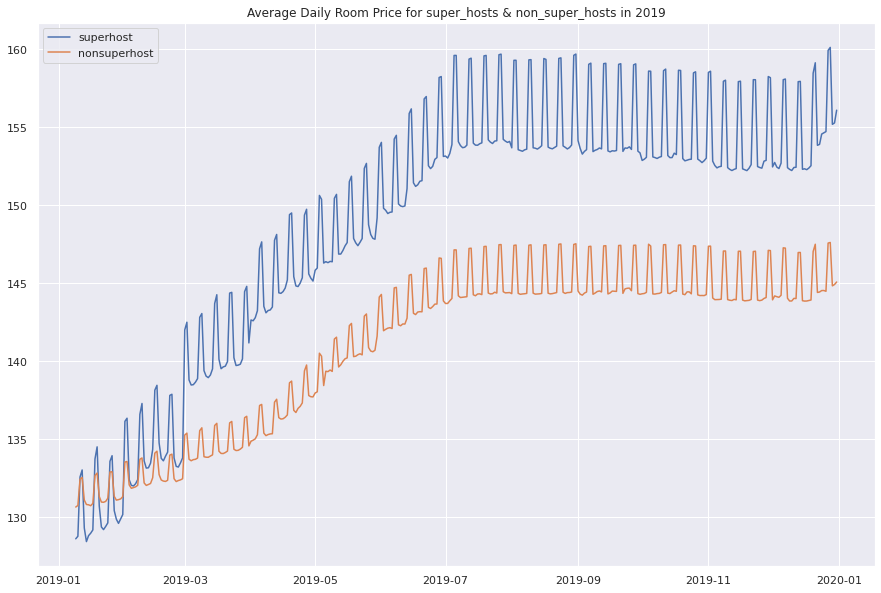

In [116]:
fig, axes = plt.subplots(figsize=(15,10))  
axes.plot(calendar_2019_super_ts["date"],calendar_2019_super_ts["price"],label="superhost")
axes.plot(calendar_2019_not_super_ts["date"],calendar_2019_not_super_ts["price"],label="nonsuperhost")
axes.set_title("Average Daily Room Price for super_hosts & non_super_hosts in 2019")
plt.legend()
plt.show()

**How did COVID-19 affect hosts' setting the price?**

* From the graph below we can see that in January, before COVID-19 hit the U.S., hosts' expectation about future prices was similar to the trend in 2019.
* When COVID-19 hit the U.S. in March, the actual prices in March were lower than what they expected in January. Prices increased a little in April, and were expected to go back to normal in May. 
* In July, the actual prices were again much lower than what was expected in January and March, and it seems like prices will go back to normal in December.

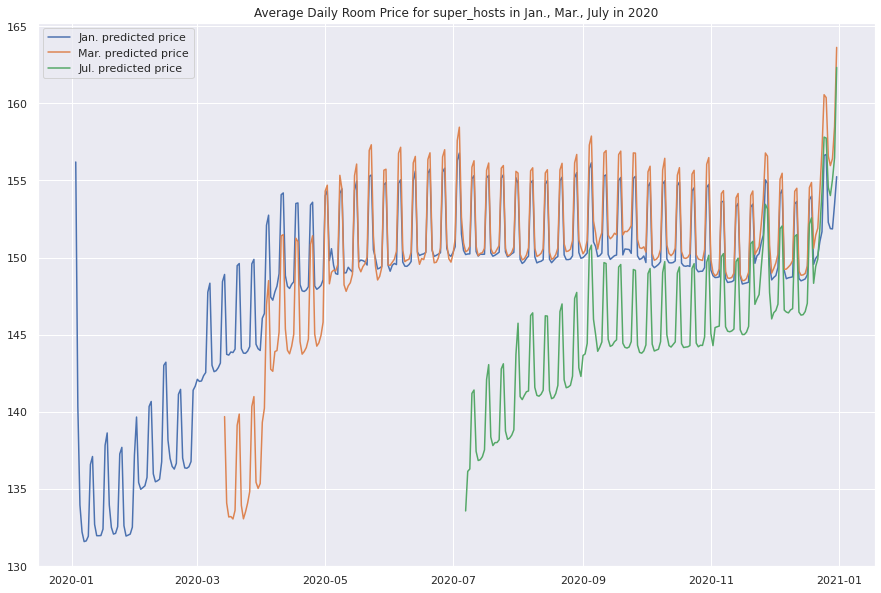

In [117]:
fig, axes = plt.subplots(figsize=(15,10))  
axes.plot(calendar_2020_1_f["date"],calendar_2020_1_f["price"],label="Jan. predicted price")
axes.plot(calendar_2020_3_f["date"],calendar_2020_3_f["price"],label="Mar. predicted price")
axes.plot(calendar_2020_7_f["date"],calendar_2020_7_f["price"],label="Jul. predicted price")
axes.set_title("Average Daily Room Price for super_hosts in Jan., Mar., July in 2020")
plt.legend()
plt.show()

**Did hosts' expectation about future prices follow the same trend in 2019?**
 
Unlike what we just saw in 2020, the actual prices in March and July 2019 were only a little different from what was expected in January 2019.

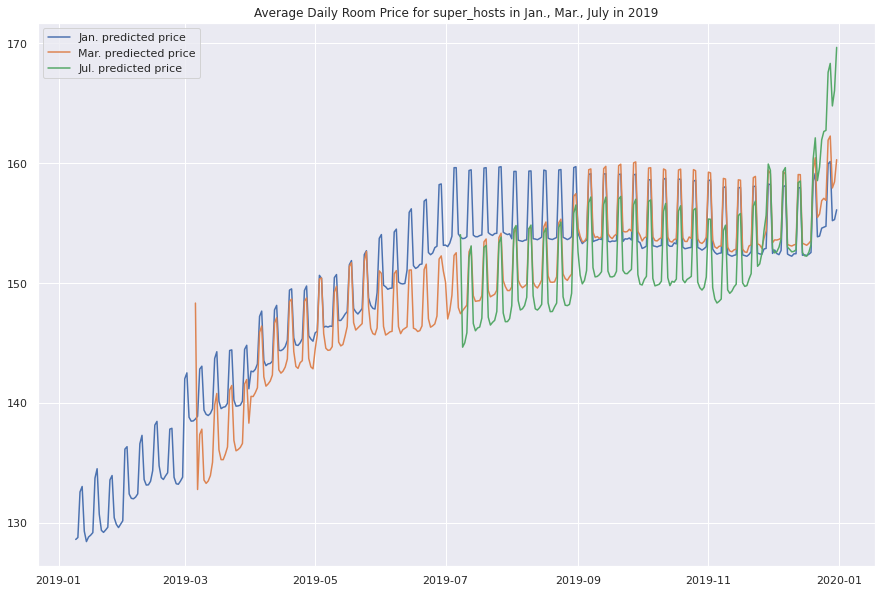

In [118]:
fig, axes = plt.subplots(figsize=(15,10))  
axes.plot(calendar_2019_super_ts["date"],calendar_2019_super_ts["price"],label="Jan. predicted price")
axes.plot(calendar_2019_3_f["date"],calendar_2019_3_f["price"],label="Mar. prediected price")
axes.plot(calendar_2019_7_f["date"],calendar_2019_7_f["price"],label="Jul. predicted price")
axes.set_title("Average Daily Room Price for super_hosts in Jan., Mar., July in 2019")
plt.legend()
plt.show()

# Machine Learning Models

## Classification Model


In this model, we will predict whether a host is a superhost based on the available features in the dataset.

In [119]:
# make a copy of the dataframe
model_df = listings.copy()

In [120]:
# fill any na values with 0
model_df.is_superhost_numeric = model_df.is_superhost_numeric.fillna(0)

Next, we drop columns that we don't believe will have any predictive power, or are duplicates of other converted columns. There are a number of columns that are URL string, for example, listing_url and picture_url, both of which would not have contributed to the model. A few of the columns, including host_response_rate and host_acceptance_rate have a very large number of missing values, and we do not feel that we had enough information available to impute the missing values accuratly. Also, a few of the columns, including host_neighbourhood, neighbourhood and neighbourhood_cleansed, have a lot of different values which would result in a lot of additional columns when creating dummy variables, and these columns also contain messy string data. There are also some datetime columns, including first_review and last_review. We chose to drop these since there are a very large number of unique values in these columns, and we don't believe that they have any predictive power.

In [121]:
model_cols = model_df.drop(columns=['id','listing_url','last_scraped','name','description','neighborhood_overview','picture_url','host_url','host_name','host_since','host_location','host_about','host_thumbnail_url','host_picture_url','host_neighbourhood','host_verifications','neighbourhood','neighbourhood_cleansed','property_type','bathrooms_text','amenities','first_review','last_review','price','host_identity_verified','host_has_profile_pic','host_is_superhost','host_response_rate','host_acceptance_rate','host_listings_count', 'host_identity_verified_numeric'], axis=1)

df_listing_dummied = pd.get_dummies(model_cols, columns=['host_response_time','neighbourhood_group_cleansed','room_type','has_availability','instant_bookable'], drop_first=True)

### Feature Engineering and Model Building 

There are many columns that are sepcific to a listing, but not global to a host. In this section, we will convert a number of columns to be an aggregation per host. For example, we will find the average_availability_30 across all of the listings for each host so that we have one value for each host.

When aggregating, we chose to take the sum of some values, and the mean of others. We chose to calculate the mean for the availability related columns in order to find the average availability for each host across all their listings. For the review socre features, we took the avarage because we felt that summing the score would not make sense in the context. We took the sum of the reviews since we felt it would make sense to calculate a total number of reviews per host.

We wanted to include the bourough for each listing as well, since we thought that the location may be correlated to being a superhost. Since this feature has 5 levels (5 different bouroughs), we eneded up with 5 different columns after generating dummy variables. We then created new columns where for each bourough, there is an average number of listings for a particular host in each bourough. Since there are many hosts with multiple listings in different bouroughs, these values could potentially be decimals.

In [122]:
# convert average_availability_30
average_availability_30_per_host = df_listing_dummied.groupby('host_id')['availability_30'].mean()
average_availability_30_per_host = pd.DataFrame(average_availability_30_per_host)
average_availability_30_per_host = average_availability_30_per_host.reset_index()
average_availability_30_per_host = average_availability_30_per_host.rename(columns={"availability_30": "average_availability_30_per_host"})

df_listing_dummied = df_listing_dummied.merge(average_availability_30_per_host, on='host_id')

df_listing_dummied = df_listing_dummied.drop(columns='availability_30', axis=1)

In [123]:
# convert average_availability_60
average_availability_60_per_host = df_listing_dummied.groupby('host_id')['availability_60'].mean()
average_availability_60_per_host = pd.DataFrame(average_availability_60_per_host)
average_availability_60_per_host = average_availability_60_per_host.reset_index()
average_availability_60_per_host = average_availability_60_per_host.rename(columns={"availability_60": "average_availability_60_per_host"})

df_listing_dummied = df_listing_dummied.merge(average_availability_60_per_host, on='host_id')

df_listing_dummied = df_listing_dummied.drop(columns='availability_60', axis=1)

In [124]:
# convert average_availability_90
average_availability_90_per_host = df_listing_dummied.groupby('host_id')['availability_90'].mean()
average_availability_90_per_host = pd.DataFrame(average_availability_90_per_host)
average_availability_90_per_host = average_availability_90_per_host.reset_index()
average_availability_90_per_host = average_availability_90_per_host.rename(columns={"availability_90": "average_availability_90_per_host"})

df_listing_dummied = df_listing_dummied.merge(average_availability_90_per_host, on='host_id')

df_listing_dummied = df_listing_dummied.drop(columns='availability_90', axis=1)

In [125]:
# convert average_availability_365
average_availability_365_per_host = df_listing_dummied.groupby('host_id')['availability_365'].mean()
average_availability_365_per_host = pd.DataFrame(average_availability_365_per_host)
average_availability_365_per_host = average_availability_365_per_host.reset_index()
average_availability_365_per_host = average_availability_365_per_host.rename(columns={"availability_365": "average_availability_365_per_host"})

df_listing_dummied = df_listing_dummied.merge(average_availability_365_per_host, on='host_id')

df_listing_dummied = df_listing_dummied.drop(columns='availability_365', axis=1)

In [126]:
# convert number of reviews
total_number_of_reviews_per_host = df_listing_dummied.groupby('host_id')['number_of_reviews'].sum()
total_number_of_reviews_per_host = pd.DataFrame(total_number_of_reviews_per_host)
total_number_of_reviews_per_host = total_number_of_reviews_per_host.reset_index()
total_number_of_reviews_per_host = total_number_of_reviews_per_host.rename(columns={"number_of_reviews": "total_number_of_reviews_per_host"})

df_listing_dummied = df_listing_dummied.merge(total_number_of_reviews_per_host, on='host_id')

df_listing_dummied = df_listing_dummied.drop(columns='number_of_reviews', axis=1)

In [127]:
# convert number of reviews_ltm
total_number_of_reviews_ltm_per_host = df_listing_dummied.groupby('host_id')['number_of_reviews_ltm'].sum()
total_number_of_reviews_ltm_per_host = pd.DataFrame(total_number_of_reviews_ltm_per_host)
total_number_of_reviews_ltm_per_host = total_number_of_reviews_ltm_per_host.reset_index()
total_number_of_reviews_ltm_per_host = total_number_of_reviews_ltm_per_host.rename(columns={"number_of_reviews_ltm": "total_number_of_reviews_ltm_per_host"})

df_listing_dummied = df_listing_dummied.merge(total_number_of_reviews_ltm_per_host, on='host_id')

df_listing_dummied = df_listing_dummied.drop(columns='number_of_reviews_ltm', axis=1)

In [128]:
# convert number_of_reviews_l30d 
total_number_of_reviews_l30d_per_host = df_listing_dummied.groupby('host_id')['number_of_reviews_l30d'].sum()
total_number_of_reviews_l30d_per_host = pd.DataFrame(total_number_of_reviews_l30d_per_host)
total_number_of_reviews_l30d_per_host = total_number_of_reviews_l30d_per_host.reset_index()
total_number_of_reviews_l30d_per_host = total_number_of_reviews_l30d_per_host.rename(columns={"number_of_reviews_l30d": "total_number_of_reviews_l30d_per_host"})

df_listing_dummied = df_listing_dummied.merge(total_number_of_reviews_l30d_per_host, on='host_id')

df_listing_dummied = df_listing_dummied.drop(columns='number_of_reviews_l30d', axis=1)

In [129]:
# convert review_scores_rating
avg_review_scores_rating_per_host = df_listing_dummied.groupby('host_id')['review_scores_rating'].mean()
avg_review_scores_rating_per_host = pd.DataFrame(avg_review_scores_rating_per_host)
avg_review_scores_rating_per_host = avg_review_scores_rating_per_host.reset_index()
avg_review_scores_rating_per_host = avg_review_scores_rating_per_host.rename(columns={"review_scores_rating": "avg_review_scores_rating_per_host"})

df_listing_dummied = df_listing_dummied.merge(avg_review_scores_rating_per_host, on='host_id')

df_listing_dummied = df_listing_dummied.drop(columns='review_scores_rating', axis=1)

In [130]:
# convert review_scores_accuracy
avg_review_scores_accuracy_per_host = df_listing_dummied.groupby('host_id')['review_scores_accuracy'].mean()
avg_review_scores_accuracy_per_host = pd.DataFrame(avg_review_scores_accuracy_per_host)
avg_review_scores_accuracy_per_host = avg_review_scores_accuracy_per_host.reset_index()
avg_review_scores_accuracy_per_host = avg_review_scores_accuracy_per_host.rename(columns={"review_scores_accuracy": "avg_review_scores_accuracy_per_host"})

df_listing_dummied = df_listing_dummied.merge(avg_review_scores_accuracy_per_host, on='host_id')

df_listing_dummied = df_listing_dummied.drop(columns='review_scores_accuracy', axis=1)

In [131]:
# convert review_scores_cleanliness
avg_review_scores_cleanliness_per_host = df_listing_dummied.groupby('host_id')['review_scores_cleanliness'].mean()
avg_review_scores_cleanliness_per_host = pd.DataFrame(avg_review_scores_cleanliness_per_host)
avg_review_scores_cleanliness_per_host = avg_review_scores_cleanliness_per_host.reset_index()
avg_review_scores_cleanliness_per_host = avg_review_scores_cleanliness_per_host.rename(columns={"review_scores_cleanliness": "avg_review_scores_cleanliness_per_host"})

df_listing_dummied = df_listing_dummied.merge(avg_review_scores_cleanliness_per_host, on='host_id')

df_listing_dummied = df_listing_dummied.drop(columns='review_scores_cleanliness', axis=1)

In [132]:
# convert review_scores_checkin
avg_review_scores_checkin_per_host = df_listing_dummied.groupby('host_id')['review_scores_checkin'].mean()
avg_review_scores_checkin_per_host = pd.DataFrame(avg_review_scores_checkin_per_host)
avg_review_scores_checkin_per_host = avg_review_scores_checkin_per_host.reset_index()
avg_review_scores_checkin_per_host = avg_review_scores_checkin_per_host.rename(columns={"review_scores_checkin": "avg_review_scores_checkin_per_host"})

df_listing_dummied = df_listing_dummied.merge(avg_review_scores_checkin_per_host, on='host_id')

df_listing_dummied = df_listing_dummied.drop(columns='review_scores_checkin', axis=1)

In [133]:
# convert review_scores_communication
avg_review_scores_communication_per_host = df_listing_dummied.groupby('host_id')['review_scores_communication'].mean()
avg_review_scores_communication_per_host = pd.DataFrame(avg_review_scores_communication_per_host)
avg_review_scores_communication_per_host = avg_review_scores_communication_per_host.reset_index()
avg_review_scores_communication_per_host = avg_review_scores_communication_per_host.rename(columns={"review_scores_communication": "avg_review_scores_checkin_per_host"})

df_listing_dummied = df_listing_dummied.merge(avg_review_scores_communication_per_host, on='host_id')

df_listing_dummied = df_listing_dummied.drop(columns='review_scores_communication', axis=1)

In [134]:
# convert review_scores_location
avg_review_scores_location_per_host = df_listing_dummied.groupby('host_id')['review_scores_location'].mean()
avg_review_scores_location_per_host = pd.DataFrame(avg_review_scores_location_per_host)
avg_review_scores_location_per_host = avg_review_scores_location_per_host.reset_index()
avg_review_scores_location_per_host = avg_review_scores_location_per_host.rename(columns={"review_scores_location": "avg_review_scores_location_per_host"})

df_listing_dummied = df_listing_dummied.merge(avg_review_scores_location_per_host, on='host_id')

df_listing_dummied = df_listing_dummied.drop(columns='review_scores_location', axis=1)

In [135]:
# convert review_scores_value 
avg_review_scores_value_per_host = df_listing_dummied.groupby('host_id')['review_scores_value'].mean()
avg_review_scores_value_per_host = pd.DataFrame(avg_review_scores_value_per_host)
avg_review_scores_value_per_host = avg_review_scores_value_per_host.reset_index()
avg_review_scores_value_per_host = avg_review_scores_value_per_host.rename(columns={"review_scores_value": "avg_review_scores_value_per_host"})

df_listing_dummied = df_listing_dummied.merge(avg_review_scores_value_per_host, on='host_id')

df_listing_dummied = df_listing_dummied.drop(columns='review_scores_value', axis=1)

In [136]:
# convert reviews_per_month
avg_reviews_per_month_per_host = df_listing_dummied.groupby('host_id')['reviews_per_month'].mean()
avg_reviews_per_month_per_host = pd.DataFrame(avg_reviews_per_month_per_host)
avg_reviews_per_month_per_host = avg_reviews_per_month_per_host.reset_index()
avg_reviews_per_month_per_host = avg_reviews_per_month_per_host.rename(columns={"reviews_per_month": "avg_reviews_per_month_per_host"})

df_listing_dummied = df_listing_dummied.merge(avg_reviews_per_month_per_host, on='host_id')

df_listing_dummied = df_listing_dummied.drop(columns='reviews_per_month', axis=1)

In [137]:
# convert neighbourhood_group_cleansed_Brooklyn
avg_Brooklyn_per_host = df_listing_dummied.groupby('host_id')['neighbourhood_group_cleansed_Brooklyn'].mean()
avg_Brooklyn_per_host = pd.DataFrame(avg_Brooklyn_per_host)
avg_Brooklyn_per_host = avg_Brooklyn_per_host.reset_index()
avg_Brooklyn_per_host = avg_Brooklyn_per_host.rename(columns={"neighbourhood_group_cleansed_Brooklyn": "avg_Brooklyn_per_host"})

df_listing_dummied = df_listing_dummied.merge(avg_Brooklyn_per_host, on='host_id')

df_listing_dummied = df_listing_dummied.drop(columns='neighbourhood_group_cleansed_Brooklyn', axis=1)

In [138]:
# convert neighbourhood_group_cleansed_Manhattan
avg_Manhattan_per_host = df_listing_dummied.groupby('host_id')['neighbourhood_group_cleansed_Manhattan'].mean()
avg_Manhattan_per_host = pd.DataFrame(avg_Manhattan_per_host)
avg_Manhattan_per_host = avg_Manhattan_per_host.reset_index()
avg_Manhattan_per_host = avg_Manhattan_per_host.rename(columns={"neighbourhood_group_cleansed_Manhattan": "avg_Brooklyn_per_host"})

df_listing_dummied = df_listing_dummied.merge(avg_Manhattan_per_host, on='host_id')

df_listing_dummied = df_listing_dummied.drop(columns='neighbourhood_group_cleansed_Manhattan', axis=1)

In [139]:
# convert neighbourhood_group_cleansed_Queens
avg_Queens_per_host = df_listing_dummied.groupby('host_id')['neighbourhood_group_cleansed_Queens'].mean()
avg_Queens_per_host = pd.DataFrame(avg_Queens_per_host)
avg_Queens_per_host = avg_Queens_per_host.reset_index()
avg_Queens_per_host = avg_Queens_per_host.rename(columns={"neighbourhood_group_cleansed_Queens": "avg_Queens_per_host"})

df_listing_dummied = df_listing_dummied.merge(avg_Manhattan_per_host, on='host_id')

df_listing_dummied = df_listing_dummied.drop(columns='neighbourhood_group_cleansed_Queens', axis=1)

In [140]:
# convert neighbourhood_group_cleansed_Staten Island
avg_Staten_Island_per_host = df_listing_dummied.groupby('host_id')['neighbourhood_group_cleansed_Staten Island'].mean()
avg_Staten_Island_per_host = pd.DataFrame(avg_Staten_Island_per_host)
avg_Staten_Island_per_host = avg_Staten_Island_per_host.reset_index()
avg_Staten_Island_per_host = avg_Staten_Island_per_host.rename(columns={"neighbourhood_group_cleansed_Staten Island": "avg_Staten_Island_per_host"})

df_listing_dummied = df_listing_dummied.merge(avg_Staten_Island_per_host, on='host_id')

df_listing_dummied = df_listing_dummied.drop(columns='neighbourhood_group_cleansed_Staten Island', axis=1)

In [141]:
# convert room_type_Hotel room
avg_room_type_Hotel_room_per_host = df_listing_dummied.groupby('host_id')['room_type_Hotel room'].mean()
avg_room_type_Hotel_room_per_host = pd.DataFrame(avg_room_type_Hotel_room_per_host)
avg_room_type_Hotel_room_per_host = avg_room_type_Hotel_room_per_host.reset_index()
avg_room_type_Hotel_room_per_host = avg_room_type_Hotel_room_per_host.rename(columns={"room_type_Hotel room": "avg_room_type_Hotel_room_per_host"})

df_listing_dummied = df_listing_dummied.merge(avg_room_type_Hotel_room_per_host, on='host_id')

df_listing_dummied = df_listing_dummied.drop(columns='room_type_Hotel room', axis=1)

In [142]:
# convert room_type_Private room
avg_room_type_Private_room_per_host = df_listing_dummied.groupby('host_id')['room_type_Private room'].mean()
avg_room_type_Private_room_per_host = pd.DataFrame(avg_room_type_Private_room_per_host)
avg_room_type_Private_room_per_host = avg_room_type_Private_room_per_host.reset_index()
avg_room_type_Private_room_per_host = avg_room_type_Private_room_per_host.rename(columns={"room_type_Private room": "avg_room_type_Private_room_per_host"})

df_listing_dummied = df_listing_dummied.merge(avg_room_type_Private_room_per_host, on='host_id')

df_listing_dummied = df_listing_dummied.drop(columns='room_type_Private room', axis=1)

In [143]:
# convert room_type_Shared room
avg_room_type_Shared_room_per_host = df_listing_dummied.groupby('host_id')['room_type_Shared room'].mean()
avg_room_type_Shared_room_per_host = pd.DataFrame(avg_room_type_Shared_room_per_host)
avg_room_type_Shared_room_per_host = avg_room_type_Shared_room_per_host.reset_index()
avg_room_type_Shared_room_per_host = avg_room_type_Shared_room_per_host.rename(columns={"room_type_Shared room": "avg_room_type_Shared_room_per_host"})

df_listing_dummied = df_listing_dummied.merge(avg_room_type_Shared_room_per_host, on='host_id')

df_listing_dummied = df_listing_dummied.drop(columns='room_type_Shared room', axis=1)

In [144]:
# convert instant_bookable_t
avg_instant_bookable_t_per_host = df_listing_dummied.groupby('host_id')['instant_bookable_t'].mean()
avg_instant_bookable_t_per_host = pd.DataFrame(avg_instant_bookable_t_per_host)
avg_instant_bookable_t_per_host = avg_instant_bookable_t_per_host.reset_index()
avg_instant_bookable_t_per_host = avg_instant_bookable_t_per_host.rename(columns={"instant_bookable_t": "avg_instant_bookable_t_per_host"})

df_listing_dummied = df_listing_dummied.merge(avg_instant_bookable_t_per_host, on='host_id')

df_listing_dummied = df_listing_dummied.drop(columns='instant_bookable_t', axis=1)

In [145]:
# convert from object type to category to prepare for model creation
df_listing_dummied.is_superhost_numeric = df_listing_dummied.is_superhost_numeric.astype('category')

In [146]:
# eliminate duplicate host_id
column_name = ['host_id']
hosts_model_df = df_listing_dummied.sort_values('host_id').drop_duplicates(subset=column_name)

### Building KNN Model Using All Features

In the first model, we chose to use all of the available features. We calculated a low sensativity score, revealing that this model is not good at differentiating between superhost and non-superhost. We then ran a Random Forest Classifier to find the most important features. We then created a second model with only the top few features and were able to calculate a much higher sensativity score.

In [147]:
# features matrix
X = hosts_model_df.drop('is_superhost_numeric', axis=1)  
# target vector
y = hosts_model_df['is_superhost_numeric']

# split the data into train and test sets
Xtrain, Xtest, ytrain, ytest = train_test_split(X, y, test_size=0.3, random_state=833)

In [148]:
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(Xtrain, ytrain)
y_model = knn.predict(Xtest)
# number of superhosts
P = sum(ytest == 1)
# total number of hosts in the dataset
n_test = len(ytest)
# the number that we correcty predicted as superhosts
TP = sum((ytest == 1) & (y_model == 1))
# true positive rate (sensitivity)
TPR = TP/P
print("True positive rate:", TPR)

True positive rate: 0.127420362273579


In [149]:
# the total number in the dataset that are not superhosts
N = sum(ytest == 0)
# true negative, or the number that we correctly identified as not superhosts
TN = sum((ytest == 0) & (y_model == 0))
# true negative rate (specificity)
TNR = TN/N
print("True negative rate:", TNR)
# false positive (the total positives - the correclty predicted positives = the falsly predicted postives)
FP = P-TP
print("False positive rate:", FP/N)
# false negative (the total negatives - the correclty predicted negatives = the falsly predicted negatives)
FN = N-TN
print("False negative rate:", FN/N)

True negative rate: 0.8854677719506006
False positive rate: 0.2363390289291152
False negative rate: 0.11453222804939943


In [150]:
# overall accuracy score
accuracy_score(ytest, y_model)

0.7239084132055378

The confusion matrix below displays the true positive, true negative, false negative, and false poitive rates that resulted from running the model with all of the features. There were a large number of false positive where we predicted that a host was a superhost when they were actually not. For this reason, we chose to run a Random Forest Classifier to determine the most important features required for the classification model.

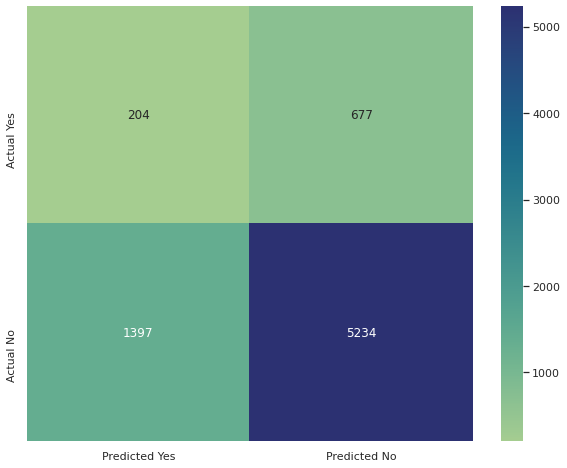

In [151]:
data=[[TP, FN], [FP, TN]]
heatmap_data = pd.DataFrame(data)
heatmap_data.columns = ['Predicted Yes', 'Predicted No']
heatmap_data.index = ['Actual Yes', 'Actual No']
sns.heatmap(heatmap_data, annot=True, cmap="crest", fmt='d')
plt.show();

The Random Forest Classifier reveals that the most important features are review related. For example, the total number of reviews that a host has in the last 12 months is the most important feature. The average number of reviews per month, as well as their cleanliness, their review score, and accuracy scores are also important. According to AirBnb ([AirBnb Superhost Requirements](https://www.airbnb.com/help/article/829/how-do-i-become-a-superhost)), a superhost should have at least a 4.8 overall rating over the last year, and our Random Forest output reiterates this point. There is also a requirement to have at least 10 reservations in the last year. Our results below are aligned with AirBnb's policies which states that  the number of reviews and quality of reviews are very important in determining if a host becomes a superhost. 

This analysis also reveals how important it is for AirBnb hosts to maintain glowing reviews since AirBnb will take this into account when selecting hosts to become superhosts. Also, it is important for a host to receive a large number of reviews, and to have at least 10 reservations within the last year.

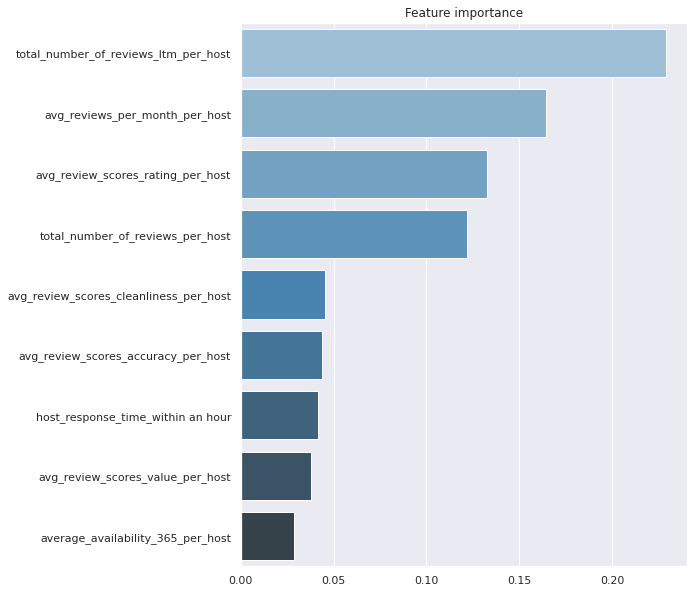

In [152]:
# determining the most important features using RandomForestClassifier
params = {'random_state': 0, 'n_jobs': 4, 'n_estimators': 5000, 'max_depth': 8}

# Drop redundant columns (for features with two unique values)
drop = ['is_superhost_numeric']
x, y = hosts_model_df.drop(drop,axis=1), hosts_model_df['is_superhost_numeric']
# Fit RandomForest Classifier
clf = RandomForestClassifier(**params)
clf = clf.fit(x, y)
# Plot features importances
imp = pd.Series(data=clf.feature_importances_, index=x.columns).sort_values(ascending=False)
plt.figure(figsize=(8,10))
plt.title("Feature importance")
ax = sns.barplot(y=imp.index[:9], x=imp.values[:9], palette="Blues_d", orient='h')
plt.show();

We noticed that the average Brooklyn per host feature appeared in the random forest ranking (even though we didn't include it in the model because it was not very significant). We were curious to know why this particular bourough appeared, but other were not even significant enough to appear on the chart at all. After creating a barchart of the number of superhosts per bourough, we discovered that there are a large number of superhosts in Brooklyn.

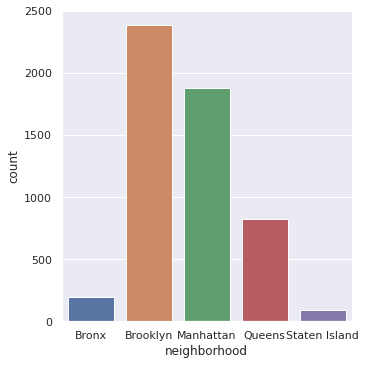

In [153]:
host_count = pd.DataFrame(hosts[hosts.is_superhost_numeric == 1].groupby('neighbourhood_group_cleansed')['host_id'].count()).reset_index()
host_count.columns = ['neighborhood','count']
sns.catplot(data= host_count, x='neighborhood',y='count', kind='bar')
plt.show();

---

### Building KNN Model Using Top Features Only

In [154]:
# subset the df for only the most important features
model_2_df = hosts_model_df[['is_superhost_numeric','total_number_of_reviews_ltm_per_host','avg_reviews_per_month_per_host','total_number_of_reviews_per_host','avg_review_scores_rating_per_host', 'host_response_time_within an hour','avg_review_scores_cleanliness_per_host','avg_review_scores_accuracy_per_host']]

In [155]:
# features matrix
X = model_2_df.drop('is_superhost_numeric', axis=1)  
# target vector
y = model_2_df['is_superhost_numeric']

# split the data into train and test sets
Xtrain, Xtest, ytrain, ytest = train_test_split(X, y, test_size=0.3, random_state=833)

In [156]:
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(Xtrain, ytrain)
y_model = knn.predict(Xtest)
# number of superhosts
P = sum(ytest == 1)
# total number of hosts in the dataset
n_test = len(ytest)
# the number that we correcty predicted as superhosts
TP = sum((ytest == 1) & (y_model == 1))
# sensativity
TPR = TP/P
print("An improved true positive rate:", TPR)

An improved true positive rate: 0.6296064959400375


In [157]:
# the total number in the dataset that are not superhosts
N = sum(ytest == 0)
# true negative, or the number that we correctly identified as not superhosts
TN = sum((ytest == 0) & (y_model == 0))
# true negative rate (specificity)
TNR = TN/N
print("True negative rate:", TNR)
# false positive (the total positives - the correclty predicted positives = the falsly predicted postives)
FP = P-TP
print("False positive rate:", FP/N)
# false negative (the total negatives - the correclty predicted negatives = the falsly predicted negatives)
FN = N-TN
print("False negative rate:", FN/N)

True negative rate: 0.9103366604635426
False positive rate: 0.10032143461343258
False negative rate: 0.08966333953645746


In [158]:
# overall accuracy score
accuracy_score(ytest, y_model)

0.8505058572949947

### Result

By selecting only the first few most important features, we were able to improve our model. We are now able to achieve a much higher sensativity score. There were a total of 1008 hosts that we correctly predicted as superhosts. The confusion matrix below displays the true positive, true negative, false negative, and false poitive rates that resulted from running the model with all of the features. The matrix displays a much lower number of false positives compared to the previous model.

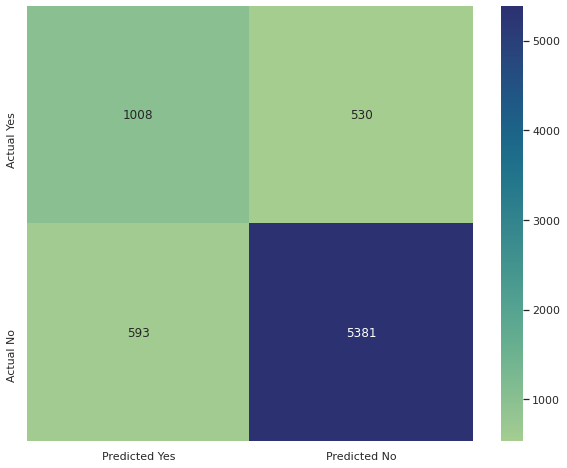

In [159]:
# create a heatmap showing the results
data=[[TP, FN], [FP, TN]]
heatmap_data = pd.DataFrame(data)
heatmap_data.columns = ['Predicted Yes', 'Predicted No']
heatmap_data.index = ['Actual Yes', 'Actual No']
sns.heatmap(heatmap_data, annot=True, cmap="crest", fmt='d')
plt.show();

## Regression Model



*  Creating a new DataFrame called "data" that will be used for our Linear Regression model. 
*  Dropping features that do not have predictive power, following a similar rationale as that of removing features while building our classification model above.

In [160]:
data = listings.copy()
data.drop(['name', 'description', 'host_name', 'host_since', 'neighborhood_overview', 'host_location', 'id', 'listing_url', 'picture_url', 'host_id', 'host_url', 'host_about', 'host_response_rate',  'host_is_superhost', 'host_thumbnail_url', 'host_picture_url',
       'host_neighbourhood', 'host_verifications', 'neighbourhood', 'neighbourhood_cleansed', 'amenities', 'has_availability', 'first_review',
       'last_review', 'host_identity_verified', 'last_scraped', 'host_response_time', 'host_acceptance_rate', 'host_acceptance_rate', 'bathrooms_text', 'host_has_profile_pic', 'host_listings_count', 'calculated_host_listings_count',
       'calculated_host_listings_count_entire_homes',
       'calculated_host_listings_count_private_rooms',
       'calculated_host_listings_count_shared_rooms', 'host_identity_verified_numeric','latitude', 'longitude', 'property_type'], inplace=True, axis=1)

In [161]:
# examine the dataframe to identify missing values and we find that is_superhost_numeric has a few missing values
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 31880 entries, 0 to 44640
Data columns (total 23 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   neighbourhood_group_cleansed  31880 non-null  object 
 1   room_type                     31880 non-null  object 
 2   accommodates                  31880 non-null  int64  
 3   bedrooms                      31880 non-null  float64
 4   beds                          31880 non-null  float64
 5   price                         31880 non-null  float64
 6   availability_30               31880 non-null  int64  
 7   availability_60               31880 non-null  int64  
 8   availability_90               31880 non-null  int64  
 9   availability_365              31880 non-null  int64  
 10  number_of_reviews             31880 non-null  int64  
 11  number_of_reviews_ltm         31880 non-null  int64  
 12  number_of_reviews_l30d        31880 non-null  int64  
 13  r

In [162]:
data.beds = data.beds.astype('float32')
data.bedrooms = data.bedrooms.astype('float32')

In [163]:
# filling null values with zero (we are assuming that hosts with no value are not a superhost)
data["is_superhost_numeric"].fillna(0.0, inplace = True)
data.is_superhost_numeric = data.is_superhost_numeric.astype('float32')

In [164]:
# one hot encoding for categorical variables
categorical_col = []
for column in data.columns:
    if len(data[column].unique()) <= 10:
        print("===============================================================================")
        print(f"{column} : {data[column].unique()}")
        categorical_col.append(column)
        
dataset = pd.get_dummies(data, columns=['neighbourhood_group_cleansed','room_type', 'instant_bookable'], drop_first=True)

# declaring features to be scaled (through standardization) to achieve data in a standard normal structure
col_to_scale = ['accommodates', 'bedrooms', 'beds', 'availability_30', 'availability_60', 'availability_90', 'availability_365', 'number_of_reviews', 'number_of_reviews_ltm', 'number_of_reviews_l30d', 'number_of_reviews_l30d', 'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value', 'reviews_per_month']

neighbourhood_group_cleansed : ['Manhattan' 'Brooklyn' 'Queens' 'Staten Island' 'Bronx']
room_type : ['Entire home/apt' 'Private room' 'Shared room' 'Hotel room']
review_scores_accuracy : [ 9.  8. 10.  7.  6.  2.  4.  3.  5.]
review_scores_cleanliness : [ 9.  8. 10.  7.  6.  4.  5.  2.  3.]
review_scores_checkin : [10.  9.  6.  8.  7.  2.  4.  5.  3.]
review_scores_communication : [10.  9.  7.  8.  6.  4.  2.  3.  5.]
review_scores_location : [10.  9.  8.  7.  6.  2.  4.  3.  5.]
review_scores_value : [ 9. 10.  8.  7.  6.  4.  3.  2.  5.]
instant_bookable : ['f' 't']
is_superhost_numeric : [0. 1.]


<AxesSubplot:title={'center':'Correlation of Features with the Price of the Listing'}>

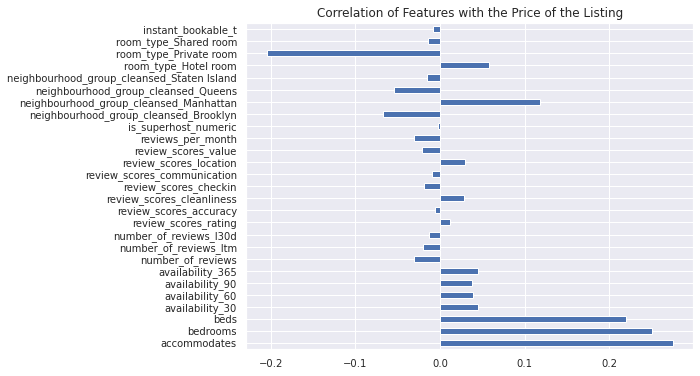

In [165]:
# using standard scaler to standardize features to achieve data that is in standard normal form
s_sc = StandardScaler()
dataset[col_to_scale] = s_sc.fit_transform(dataset[col_to_scale])

# plotting the correlation of all the features with the dependant variable (price)
dataset.drop('price', axis=1).corrwith(dataset.price).plot.barh(figsize=(8, 6), 
                                                        title='Correlation of Features with the Price of the Listing',
                                                        fontsize=10, grid=True)

### Predicting Price for All Listings

We are now running a linear regression model for the price of all listings.

In [166]:
# splitting the data into test and train datasets
X = dataset.drop(['price', 'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value'], axis=1)
y = dataset['price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

In [167]:
# the print_evaluate function is called to generate the MAE, MSE, RMSE, and R2 for in sample and out of sample
def print_evaluate(true, predicted):  
    mae = metrics.mean_absolute_error(true, predicted)
    mse = metrics.mean_squared_error(true, predicted)
    rmse = np.sqrt(metrics.mean_squared_error(true, predicted))
    r2_square = metrics.r2_score(true, predicted)
    print('MAE:', mae)
    print('MSE:', mse)
    print('RMSE:', rmse)
    print('R-Squared', r2_square)

In [168]:
lin_reg = LinearRegression(normalize=True)
lin_reg.fit(X_train,y_train)
print("In Sample Test Dataset Prediction")
print("-------------------------------------------------------------------------------")
print_evaluate(y_train, lin_reg.predict(X_train))
print("=======================================================================================================================")
print("Out of Sample Test Dataset Prediction")
print("-------------------------------------------------------------------------------")
print_evaluate(y_test, lin_reg.predict(X_test))

In Sample Test Dataset Prediction
-------------------------------------------------------------------------------
MAE: 61.83075792610622
MSE: 49282.50884458942
RMSE: 221.996641516464
R-Squared 0.12288678537142994
Out of Sample Test Dataset Prediction
-------------------------------------------------------------------------------
MAE: 62.3991117658618
MSE: 68174.93444654635
RMSE: 261.1033022513242
R-Squared 0.08872868947300039


The in sample R-squared is 12.3% due to the outliers for price as displayed in the plot below. We notice that the in sample R-squared is low because the price includes outliers (price > $500). 

For this reason we then proceed to generate another model in which we filter for price less than $500.

/opt/conda/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



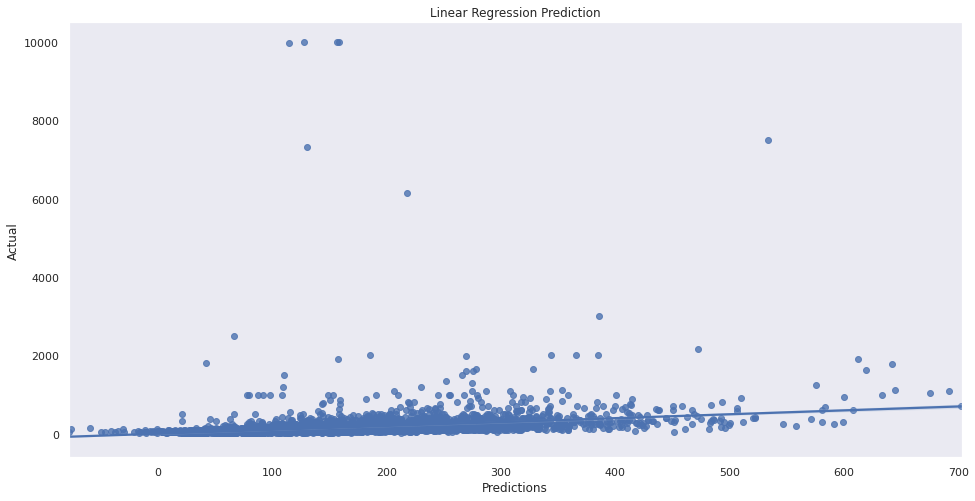

In [169]:
plt.figure(figsize=(16,8))
sns.regplot(lin_reg.predict(X_test),y_test)
plt.xlabel('Predictions')
plt.ylabel('Actual')
plt.title("Linear Regression Prediction")
plt.grid(False)
plt.show();

### Predicting Price for Listings < $500

We are now filtering for price less than $500 in order to remove outliers from the dataset.

In [170]:
dataset_filtered = dataset[dataset['price'] < 500]
X = dataset_filtered.drop(['price', 'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value'], axis=1)
y = dataset_filtered['price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

In [171]:
lin_reg = LinearRegression(normalize=True)
lin_reg.fit(X_train,y_train)
print("In Sample Test Dataset Prediction")
print("-------------------------------------------------------------------------------")
print_evaluate(y_train, lin_reg.predict(X_train))
print("=======================================================================================================================")
print("Out of Sample Test Dataset Prediction")
print("-------------------------------------------------------------------------------")
print_evaluate(y_test, lin_reg.predict(X_test))

In Sample Test Dataset Prediction
-------------------------------------------------------------------------------
MAE: 39.404713319424324
MSE: 3265.607201176797
RMSE: 57.145491521001
R-Squared 0.4730276700420991
Out of Sample Test Dataset Prediction
-------------------------------------------------------------------------------
MAE: 39.18848882405509
MSE: 3257.1377018035387
RMSE: 57.07133870695113
R-Squared 0.46519830365083714


The in sample R-squared is much higher after removing the outliers. We achieved an R-squared of 47.3%. However, the plot below displays some negative value predictions for price. We decided to take the log of price in order to resolve this issue as displayed in the next steps below.

/opt/conda/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



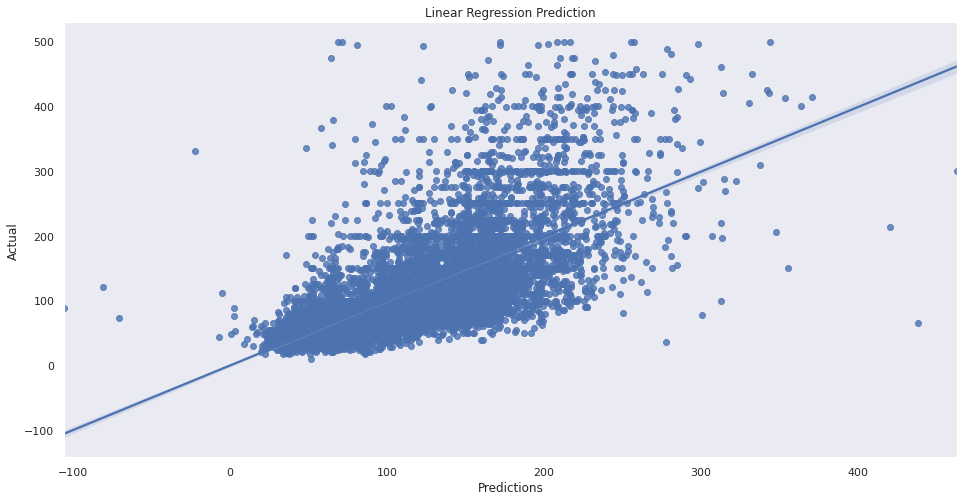

In [172]:
plt.figure(figsize=(16,8))
sns.regplot(lin_reg.predict(X_test),y_test)
plt.xlabel('Predictions')
plt.ylabel('Actual')
plt.title("Linear Regression Prediction")
plt.grid(False)
plt.show();

### Predicting Price for Listings Less Than $500 (Taking the *log* of Price)

We will now take the log of price.

In [173]:
# taking the log of price and splitting data
X = dataset.drop(['price', 'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value'], axis=1)
y = np.log(dataset['price'])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

In [174]:
lin_reg = LinearRegression(normalize=True)
lin_reg.fit(X_train,y_train)
print("In Sample Test Dataset Prediction")
print("-------------------------------------------------------------------------------")
print_evaluate(y_train, lin_reg.predict(X_train))
print("=======================================================================================================================")
print("Out of Sample Test Dataset Prediction")
print("-------------------------------------------------------------------------------")
print_evaluate(y_test, lin_reg.predict(X_test))

In Sample Test Dataset Prediction
-------------------------------------------------------------------------------
MAE: 0.34093177215779075
MSE: 0.21545542402440362
RMSE: 0.4641717613388428
R-Squared 0.5327410365206642
Out of Sample Test Dataset Prediction
-------------------------------------------------------------------------------
MAE: 0.3383847579339009
MSE: 0.21305424275612217
RMSE: 0.4615779920621456
R-Squared 0.5373070060885932


The in sample and out of sample R-squared have increased to about 53% for the entire dataset. Taking the log of the price also accounts for outliers since in this model, we chose not to filter for price. It is generally good to take the log of the dependant variable when the data is skewed.

We also observed that the in sample and out of smaple R-squared show a minimal difference which indicates that the linear regression is a good model for predicting price.

/opt/conda/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



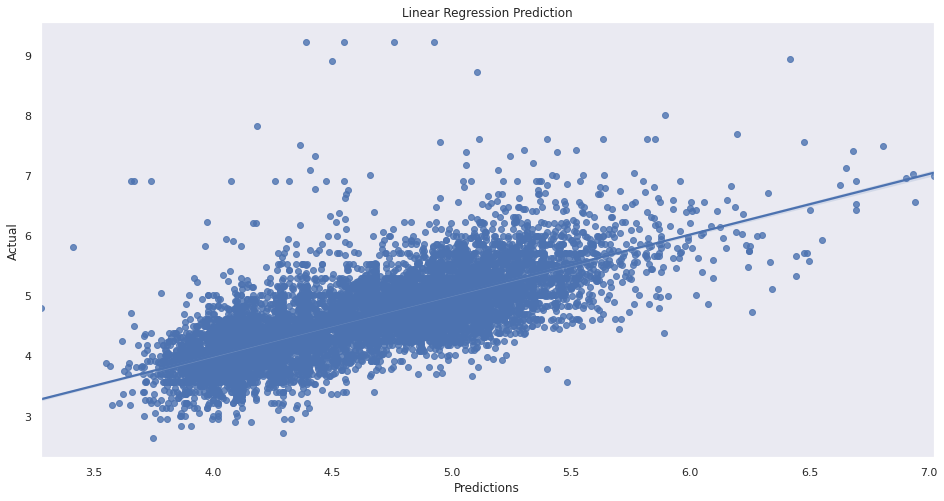

In [175]:
plt.figure(figsize=(16,8))
sns.regplot(lin_reg.predict(X_test),y_test)
plt.xlabel('Predictions')
plt.ylabel('Actual')
plt.title("Linear Regression Prediction")
plt.grid(False)
plt.show();

In [176]:
linear_model = sm.OLS(y,sm.add_constant(X)).fit()
pred = linear_model.predict(sm.add_constant(X))
print(linear_model.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.534
Model:                            OLS   Adj. R-squared:                  0.534
Method:                 Least Squares   F-statistic:                     1828.
Date:                Wed, 02 Dec 2020   Prob (F-statistic):               0.00
Time:                        00:21:45   Log-Likelihood:                -20708.
No. Observations:               31880   AIC:                         4.146e+04
Df Residuals:                   31859   BIC:                         4.163e+04
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                                                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------

The output above displays the coefficients, test statistics, and p-values for the multiple linear regression. We notice that availability_90, availability_365, and number_of_reviews are not statistically significant (p-value > 0.05). This indicates that these features are not useful in predicting price. The adjusted R-squared is the same as the R-squared which indicates that multicollinearity is not cause of concern. (The adjusted R-squared peanalizes the model if multicollinearity exists.)

### Decision Tree

We also tried implementing a Decision Tree model, but found  a huge difference in the in sample and out of sample R-squared values. For this reason, we recommend using a linear regression model to predict price.

In [177]:
'''Decision Tree Regressor'''
DTree = DecisionTreeRegressor(min_samples_leaf=.0001)
DTree.fit(X_train,y_train)

print("In Sample Test Dataset Prediction")
print("-------------------------------------------------------------------------------")

print_evaluate(y_train, DTree.predict(X_train))
print("=======================================================================================================================")

print("Out of Sample Test Dataset Prediction")
print("-------------------------------------------------------------------------------")
print_evaluate(y_test, DTree.predict(X_test))

In Sample Test Dataset Prediction
-------------------------------------------------------------------------------
MAE: 0.2075353850054754
MSE: 0.08685961326075363
RMSE: 0.29471955018416
R-Squared 0.81162724009288
Out of Sample Test Dataset Prediction
-------------------------------------------------------------------------------
MAE: 0.4039846152007381
MSE: 0.2956440920972795
RMSE: 0.5437316361011924
R-Squared 0.3579454305385845


# Conclusion

We noticied that there is higher competition for Airbnb hosts in Manhattan, and that the most expensive neighborhoods (Flatiron District and Tribeca) are located in downtown Manhattan. Also, there are a large number of entire home/apartment type listings in Manhattan which indicates that hosts in Manhattan might percieve Airbnb listings as a business opportunity, viz-av-z hosts in Brooklyn, who would be looking to save rent/money by renting out private rooms.

COVID-19 impacted the price of listings which reduced after the onset of the pandemic. The nunber of reviews also decreased as a result of the pandemic. 

The number of reviews plays a significant role in determining the prediction of host types, but is not significant in predicting price of listings. However, features related to accommodation, room type and neighborhoods in Manhattan, Queens and Brooklyn play an important role in determining future price of the listings. These features would be crucial for AirBnb to predict revenue.

## Recommendations for Prospective Hosts

* Regular updates of listing images and descriptions as accuracy ratings are based on these features
* Adjustment of listing prices based on the availability of competing listings within the neighborhood, especially during special circumstances such as COVID-19 
* We observe a trend of higher listing prices for superhosts, which provides prospective hosts with a great incentive to aim for becoming superhosts
* Hosts can place more emphasis in increasing exposure of the listing and the number of positive reviews
* Prospective hosts can penetrate markets/boroughs with popular neighborhood locations where listings are in higher demand